In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

In [2]:
result_df = pd.read_csv('/home/ne34gux/workspace/experiments/results/all_results.csv')
result_df

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,single_coord_linear_mlp,case_k_003_left,0.1000,30,grid128,False,mse,0.203388,0.338469,0.674098
1,single_coord_linear_mlp,case_k_008_right,0.1000,30,grid128,False,mse,0.086560,0.237911,0.815950
2,single_coord_linear_mlp,case_m_006_left,0.1000,30,grid128,False,mse,0.080045,0.218818,0.927286
3,single_coord_linear_mlp,case_w_027_right,0.1000,30,grid128,False,mse,0.093167,0.249555,0.817183
4,single_coord_linear_mlp,case_w_038_left,0.1000,30,grid128,False,mse,0.111093,0.265403,0.821367
...,...,...,...,...,...,...,...,...,...,...
6187,pointnet,case_w_038_left,0.0001,30,grid128,False,mse,0.052433,0.172044,0.828181
6188,pointnet,aneurysm1,0.0001,30,grid128,False,mse,0.025502,0.133076,0.830879
6189,pointnet,aneurysm2,0.0001,30,grid128,False,mse,0.041713,0.180162,0.775443
6190,pointnet,bifurication,0.0001,30,grid128,False,mse,0.052190,0.151951,0.912485


In [3]:
for c in result_df['Case'].unique():
    print(c)

case_k_003_left
case_k_008_right
case_m_006_left
case_w_027_right
case_w_038_left
aneurysm1
aneurysm2
bifurication
cylinder


# 1. Baseline 

In [4]:
unit_cube_df = result_df[result_df['Transformation'] == 'unitcube']
unit_cube_df

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
9,single_coord_linear_mlp,case_k_003_left,0.1000,30,unitcube,False,mse,0.126710,0.196697,0.280479
10,single_coord_linear_mlp,case_k_008_right,0.1000,30,unitcube,False,mse,0.027403,0.113401,0.373016
11,single_coord_linear_mlp,case_m_006_left,0.1000,30,unitcube,False,mse,0.022401,0.108397,0.589255
12,single_coord_linear_mlp,case_w_027_right,0.1000,30,unitcube,False,mse,0.037499,0.136550,0.248340
13,single_coord_linear_mlp,case_w_038_left,0.1000,30,unitcube,False,mse,0.052493,0.158665,0.422367
...,...,...,...,...,...,...,...,...,...,...
6142,pointnet,case_w_038_left,0.0001,30,unitcube,False,mse,0.053037,0.160530,0.413909
6143,pointnet,bifurication,0.0001,30,unitcube,False,mse,0.007197,0.057415,0.854085
6144,pointnet,aneurysm2,0.0001,30,unitcube,False,mse,0.014279,0.081083,0.134318
6145,pointnet,aneurysm1,0.0001,30,unitcube,False,mse,0.018030,0.100037,0.193156


In [5]:
best_unit_cube = unit_cube_df.groupby(["Model_Name", "Case", "Rotation"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)
best_unit_cube

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0100,30,unitcube,False,mse,0.013238,0.075121,-0.055570
1,large_sample_linear_autoencoder,aneurysm1,0.0100,1,unitcube,True,mse,0.012435,0.071886,-0.011161
2,large_sample_linear_autoencoder,aneurysm2,0.0100,50,unitcube,False,mse,0.008216,0.049669,0.083326
3,large_sample_linear_autoencoder,aneurysm2,0.0100,1,unitcube,True,mse,0.008949,0.051907,0.002869
4,large_sample_linear_autoencoder,bifurication,0.0100,100,unitcube,False,mse,0.002283,0.032090,0.824174
...,...,...,...,...,...,...,...,...,...,...
94,small_sample_linear_autoencoder,case_w_027_right,0.1000,1,unitcube,True,mse,0.036161,0.131855,0.265657
95,small_sample_linear_autoencoder,case_w_038_left,0.0010,50,unitcube,False,mse,0.052767,0.159838,0.418347
96,small_sample_linear_autoencoder,case_w_038_left,0.0010,50,unitcube,True,mse,0.052558,0.159184,0.414895
97,small_sample_linear_autoencoder,cylinder,0.0001,50,unitcube,False,mse,0.003928,0.040786,0.943179


In [6]:
# average mse, mae, cosine similarity for each model
best_unit_cube.groupby(["Model_Name"]).mean(numeric_only=True)

,Learning_Rate,Epochs,Rotation,MSE,MAE,Cosine_Similarity
Model_Name,,,,,,
large_sample_linear_autoencoder,0.00510,42.055556,0.5,0.033147,0.099549,0.358667
pointnet,0.00060,28.722222,0.5,0.033613,0.105754,0.377432
pointnetpp,0.00635,23.666667,0.5,0.033409,0.106909,0.425589
single_coord_linear_encoder,0.03480,14.888889,0.0,0.032386,0.102566,0.426249
single_coord_linear_mlp,0.03085,31.222222,0.5,0.032402,0.103656,0.444879
small_sample_linear_autoencoder,0.03425,17.222222,0.5,0.033656,0.107438,0.426919


In [7]:
print(best_unit_cube.mean(numeric_only=True))
best_unit_cube.groupby(["Model_Name"]).mean(numeric_only=True)

Learning_Rate         0.017191
Epochs               27.333333
Rotation              0.454545
MSE                   0.033167
MAE                   0.104471
Cosine_Similarity     0.408475
dtype: float64


,Learning_Rate,Epochs,Rotation,MSE,MAE,Cosine_Similarity
Model_Name,,,,,,
large_sample_linear_autoencoder,0.00510,42.055556,0.5,0.033147,0.099549,0.358667
pointnet,0.00060,28.722222,0.5,0.033613,0.105754,0.377432
pointnetpp,0.00635,23.666667,0.5,0.033409,0.106909,0.425589
single_coord_linear_encoder,0.03480,14.888889,0.0,0.032386,0.102566,0.426249
single_coord_linear_mlp,0.03085,31.222222,0.5,0.032402,0.103656,0.444879
small_sample_linear_autoencoder,0.03425,17.222222,0.5,0.033656,0.107438,0.426919


In [8]:
print("MEAN\n", best_unit_cube.mean(numeric_only=True))
print()
print("STD\n", best_unit_cube.std(numeric_only=True))
best_unit_cube.groupby(["Model_Name"]).mean(numeric_only=True)

MEAN
 Learning_Rate         0.017191
Epochs               27.333333
Rotation              0.454545
MSE                   0.033167
MAE                   0.104471
Cosine_Similarity     0.408475
dtype: float64

STD
 Learning_Rate         0.035338
Epochs               29.062213
Rotation              0.500464
MSE                   0.036768
MAE                   0.049467
Cosine_Similarity     0.289208
dtype: float64


,Learning_Rate,Epochs,Rotation,MSE,MAE,Cosine_Similarity
Model_Name,,,,,,
large_sample_linear_autoencoder,0.00510,42.055556,0.5,0.033147,0.099549,0.358667
pointnet,0.00060,28.722222,0.5,0.033613,0.105754,0.377432
pointnetpp,0.00635,23.666667,0.5,0.033409,0.106909,0.425589
single_coord_linear_encoder,0.03480,14.888889,0.0,0.032386,0.102566,0.426249
single_coord_linear_mlp,0.03085,31.222222,0.5,0.032402,0.103656,0.444879
small_sample_linear_autoencoder,0.03425,17.222222,0.5,0.033656,0.107438,0.426919


In [9]:
import torch

def calculate_angle_difference(tensor1, tensor2, chunk_size=10000, degrees=True, skip_zero_vectors=True):
    """
    Calculate the angle difference between two tensors of shape (N, 3) in chunks, skipping zero-vectors.

    Args:
    tensor1 (torch.Tensor): First tensor of shape (N, 3).
    tensor2 (torch.Tensor): Second tensor of shape (N, 3).
    chunk_size (int): Size of chunks to split the tensors into for processing.
    degrees (bool): If True, return the angle difference in degrees. Otherwise, return in radians.
    skip_zero_vectors (bool): If True, skip zero-vectors. Otherwise, set angle to 360 degrees for zero vectors.

    Returns:
    torch.Tensor: Angle difference between the two tensors in radians or degrees.
    """
    angle_differences = []
    for i in range(0, tensor1.shape[0], chunk_size):
        t1_chunk = tensor1[i:i+chunk_size]
        t2_chunk = tensor2[i:i+chunk_size]
        
        # Calculate norms
        norm_tensor1 = torch.norm(t1_chunk, dim=1)
        norm_tensor2 = torch.norm(t2_chunk, dim=1)
        
        # Skip zero-vectors
        non_zero_mask = (norm_tensor1 != 0) & (norm_tensor2 != 0)
        if skip_zero_vectors:
            t1_chunk = t1_chunk[non_zero_mask]
            t2_chunk = t2_chunk[non_zero_mask]
        else:
            zero_mask = ~non_zero_mask
            zero_angles = torch.full((zero_mask.sum(),), 360 if degrees else 2 * torch.pi)
        
        # Normalize vectors
        t1_chunk = t1_chunk / norm_tensor1[non_zero_mask].unsqueeze(1)
        t2_chunk = t2_chunk / norm_tensor2[non_zero_mask].unsqueeze(1)
        
        # Calculate dot product
        dot_product = torch.sum(t1_chunk * t2_chunk, dim=1)
        
        # Clamp dot product to avoid numerical issues with arccos
        dot_product = torch.clamp(dot_product, -1.0, 1.0)
        
        # Calculate angle difference
        angle_diff = torch.acos(dot_product)
        if degrees:
            angle_diff = torch.rad2deg(angle_diff)
        angle_differences.append(angle_diff)
        
        if not skip_zero_vectors:
            angle_differences.append(zero_angles)
    
    return torch.cat(angle_differences)

def calculate_cosine_similarity(tensor1, tensor2, chunk_size=10000, skip_zero_vectors=True):
    """
    Calculate the cosine similarity between two tensors of shape (N, 3) in chunks, skipping zero-vectors.

    Args:
    tensor1 (torch.Tensor): First tensor of shape (N, 3).
    tensor2 (torch.Tensor): Second tensor of shape (N, 3).
    chunk_size (int): Size of chunks to split the tensors into for processing.
    skip_zero_vectors (bool): If True, skip zero-vectors. Otherwise, set cosine similarity to -1 for zero vectors.

    Returns:
    torch.Tensor: Cosine similarity between the two tensors.
    """
    cosine_similarity = []
    for i in range(0, tensor1.shape[0], chunk_size):
        t1_chunk = tensor1[i:i+chunk_size]
        t2_chunk = tensor2[i:i+chunk_size]
        
        # Calculate norms
        norm_tensor1 = torch.norm(t1_chunk, dim=1)
        norm_tensor2 = torch.norm(t2_chunk, dim=1)
        
        # Skip zero-vectors
        non_zero_mask = (norm_tensor1 != 0) & (norm_tensor2 != 0)
        if skip_zero_vectors:
            t1_chunk = t1_chunk[non_zero_mask]
            t2_chunk = t2_chunk[non_zero_mask]
        else:
            zero_mask = ~non_zero_mask
            zero_cosine = torch.full((zero_mask.sum(),), -1.0)
        
        dot_product = torch.sum(t1_chunk * t2_chunk, dim=1)
        norm_tensor1 = norm_tensor1[non_zero_mask]
        norm_tensor2 = norm_tensor2[non_zero_mask]
        
        cosine_similarity.append(dot_product / (norm_tensor1 * norm_tensor2))
        
        if not skip_zero_vectors:
            cosine_similarity.append(zero_cosine)
    
    return torch.cat(cosine_similarity)

In [10]:
def print_latex(data_frame, caption=None, label=None, float_format="%.3f", position="ht"):
    print(
        data_frame.to_latex(
            position=position,
            multicolumn=True,
            float_format=float_format,
            multirow=True,
            caption=caption,
            label=label,
            escape=True
        )
    )

In [11]:
print_latex(
    best_unit_cube[["Model_Name", "MSE", "MAE", "Cosine_Similarity"]].groupby(["Model_Name"]).mean(numeric_only=True),
    caption="Mean values for each model",
    label="tab:unit_cube_mean_values"
)
best_unit_cube[["Model_Name", "MSE", "MAE", "Cosine_Similarity"]].groupby(["Model_Name"]).mean(numeric_only=True)

\begin{table}[ht]
\caption{Mean values for each model}
\label{tab:unit_cube_mean_values}
\begin{tabular}{lrrr}
\toprule
 & MSE & MAE & Cosine\_Similarity \\
Model_Name &  &  &  \\
\midrule
large\_sample\_linear\_autoencoder & 0.033 & 0.100 & 0.359 \\
pointnet & 0.034 & 0.106 & 0.377 \\
pointnetpp & 0.033 & 0.107 & 0.426 \\
single\_coord\_linear\_encoder & 0.032 & 0.103 & 0.426 \\
single\_coord\_linear\_mlp & 0.032 & 0.104 & 0.445 \\
small\_sample\_linear\_autoencoder & 0.034 & 0.107 & 0.427 \\
\bottomrule
\end{tabular}
\end{table}



,MSE,MAE,Cosine_Similarity
Model_Name,,,
large_sample_linear_autoencoder,0.033147,0.099549,0.358667
pointnet,0.033613,0.105754,0.377432
pointnetpp,0.033409,0.106909,0.425589
single_coord_linear_encoder,0.032386,0.102566,0.426249
single_coord_linear_mlp,0.032402,0.103656,0.444879
small_sample_linear_autoencoder,0.033656,0.107438,0.426919


In [12]:
print_latex(
    best_unit_cube[["MSE", "MAE", "Cosine_Similarity"]].agg(['mean', 'std'], numeric_only=True).T.rename(columns={'mean': 'Mean', 'std': 'Std'}).rename_axis('Metric'),
    caption="Mean values for each model",
    label="tab:unit_cube_mean_std_values"
)
best_unit_cube[["MSE", "MAE", "Cosine_Similarity"]].agg(['mean', 'std'], numeric_only=True).T.rename(columns={'mean': 'Mean', 'std': 'Std'}).rename_axis('Metric')

\begin{table}[ht]
\caption{Mean values for each model}
\label{tab:unit_cube_mean_std_values}
\begin{tabular}{lrr}
\toprule
 & Mean & Std \\
Metric &  &  \\
\midrule
MSE & 0.033 & 0.037 \\
MAE & 0.104 & 0.049 \\
Cosine\_Similarity & 0.408 & 0.289 \\
\bottomrule
\end{tabular}
\end{table}



,Mean,Std
Metric,,
MSE,0.033167,0.036768
MAE,0.104471,0.049467
Cosine_Similarity,0.408475,0.289208


In [13]:
best_unit_cube[["MSE", "MAE", "Cosine_Similarity"]].mean()
# Calculate mean and standard deviation for each metric
metrics_summary = best_unit_cube[["Model_Name", "MSE", "MAE", "Cosine_Similarity"]].groupby("Model_Name").agg(['mean', 'std']).reset_index()

# Flatten the multi-level columns
metrics_summary.columns = ['_'.join(col).strip() if col[1] else col[0] for col in metrics_summary.columns.values]

# Rename columns for better readability
metrics_summary.rename(columns={
    'Model_Name_': 'Model_Name',
    'MSE_mean': 'MSE Mean',
    'MSE_std': 'MSE STD',
    'MAE_mean': 'MAE Mean',
    'MAE_std': 'MAE STD',
    'Cosine_Similarity_mean': 'CS Mean',
    'Cosine_Similarity_std': 'CS STD'
}, inplace=True)

# Display the dataframe
metrics_summary

,Model_Name,MSE Mean,MSE STD,MAE Mean,MAE STD,CS Mean,CS STD
0,large_sample_linear_autoencoder,0.033147,0.038291,0.099549,0.053238,0.358667,0.319131
1,pointnet,0.033613,0.037646,0.105754,0.050897,0.377432,0.298193
2,pointnetpp,0.033409,0.037733,0.106909,0.049175,0.425589,0.270718
3,single_coord_linear_encoder,0.032386,0.038190,0.102566,0.051076,0.426249,0.269447
4,single_coord_linear_mlp,0.032402,0.037229,0.103656,0.049877,0.444879,0.293062
5,small_sample_linear_autoencoder,0.033656,0.037583,0.107438,0.050021,0.426919,0.303606


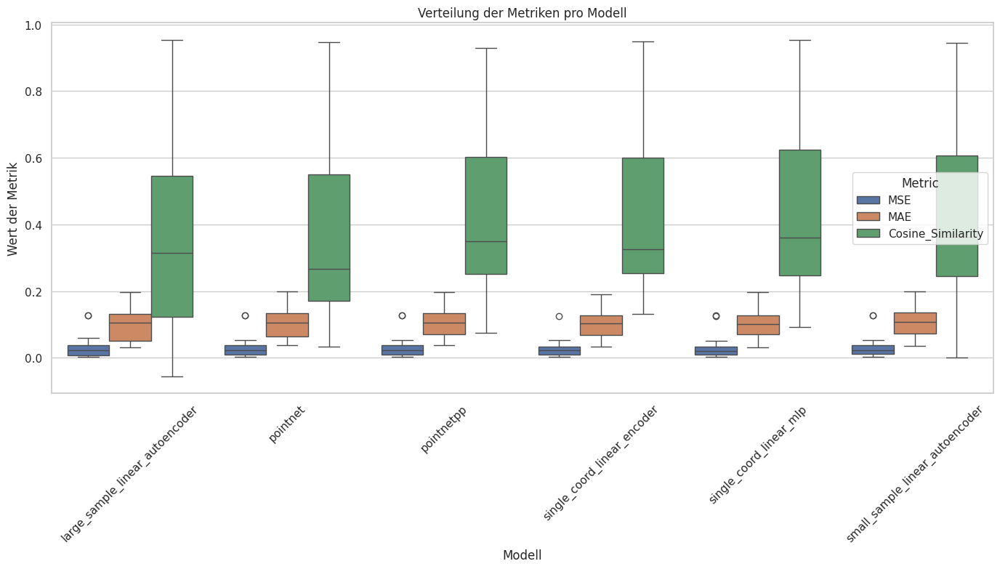

In [14]:
sns.set(style="whitegrid")

# Create a dataframe for MSE, MAE, and Cosine Similarity
metrics_distribution = best_unit_cube.melt(id_vars=["Model_Name"], value_vars=["MSE", "MAE", "Cosine_Similarity"], var_name="Metric", value_name="Value")

# Plot erstellen
plt.figure(figsize=(14, 8))
sns.boxplot(data=metrics_distribution, x='Model_Name', y='Value', hue='Metric')
plt.title('Verteilung der Metriken pro Modell')
plt.xlabel('Modell')
plt.ylabel('Wert der Metrik')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

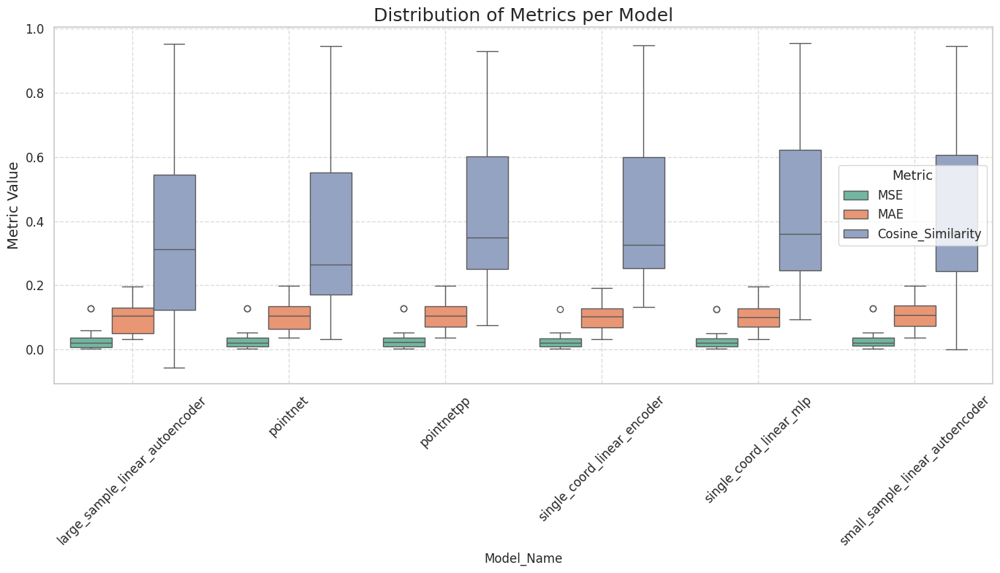

In [15]:
sns.set(style="whitegrid")

# Create a dataframe for MSE, MAE, and Cosine Similarity
metrics_distribution = best_unit_cube.melt(id_vars=["Model_Name"], value_vars=["MSE", "MAE", "Cosine_Similarity"], var_name="Metric", value_name="Value")

# Plot erstellen
plt.figure(figsize=(14, 8))
palette = sns.color_palette("Set2")
sns.boxplot(data=metrics_distribution, x='Model_Name', y='Value', hue='Metric', palette=palette)
plt.title('Distribution of Metrics per Model', fontsize=18)
plt.ylabel('Metric Value', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Metric', title_fontsize='13', fontsize='12')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

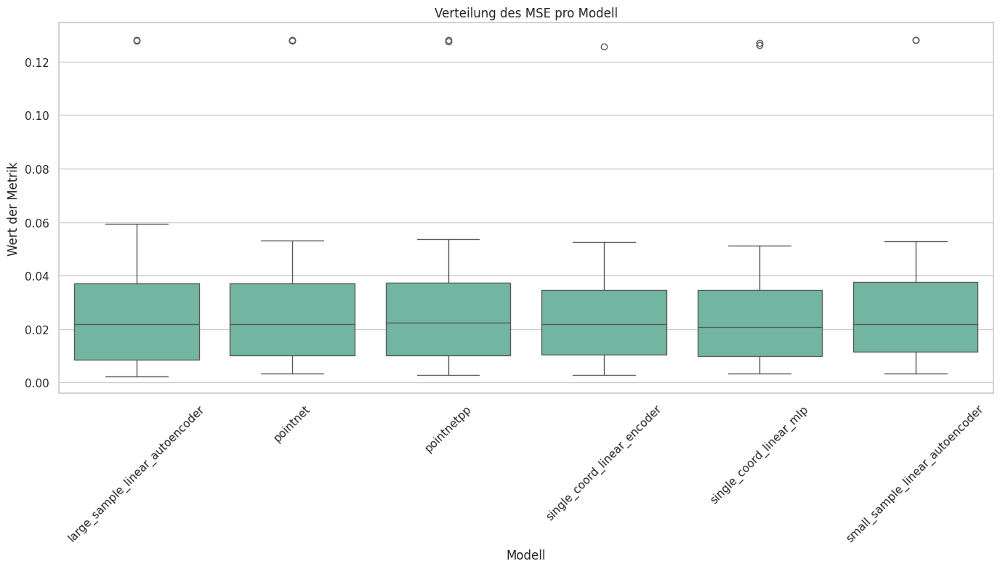

In [16]:
sns.set(style="whitegrid")

unit_cube_mse_distribution = best_unit_cube.groupby(["Model_Name"]).apply(lambda x: x["MSE"]).reset_index()

# Plot erstellen
plt.figure(figsize=(14, 8))
sns.boxplot(data=unit_cube_mse_distribution, x='Model_Name', y='MSE', palette=sns.color_palette("Set2", 1))
plt.title('Verteilung des MSE pro Modell')
plt.xlabel('Modell')
plt.ylabel('Wert der Metrik')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [17]:
# Oberen Ausreißer sind testergebnisse auf einem bestimmen Case
best_unit_cube[best_unit_cube['MSE'] >= 0.1].sort_values(by='MSE', ascending=False)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
87,small_sample_linear_autoencoder,case_k_003_left,0.0100,10,unitcube,False,mse,0.128195,0.199426,0.263250
42,pointnetpp,case_k_003_left,0.0010,30,unitcube,False,mse,0.128097,0.198018,0.252586
6,large_sample_linear_autoencoder,case_k_003_left,0.0100,100,unitcube,False,mse,0.128064,0.188179,0.256178
24,pointnet,case_k_003_left,0.0010,10,unitcube,False,mse,0.128040,0.198999,0.263160
88,small_sample_linear_autoencoder,case_k_003_left,0.0010,50,unitcube,True,mse,0.128029,0.198515,0.258583
7,large_sample_linear_autoencoder,case_k_003_left,0.0001,1,unitcube,True,mse,0.127810,0.196960,0.255656
25,pointnet,case_k_003_left,0.0010,30,unitcube,True,mse,0.127737,0.197651,0.260290
43,pointnetpp,case_k_003_left,0.0010,1,unitcube,True,mse,0.127629,0.192430,0.255738
70,single_coord_linear_mlp,case_k_003_left,0.1000,50,unitcube,True,mse,0.126938,0.196068,0.267057
69,single_coord_linear_mlp,case_k_003_left,0.0100,50,unitcube,False,mse,0.126077,0.195620,0.278391


In [18]:
# Top 3 Modelle mit der niedrigsten MSE
best_unit_cube[best_unit_cube['Rotation']==False].sort_values(by='MSE', ascending=True).head(3)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
4,large_sample_linear_autoencoder,bifurication,0.010,100,unitcube,False,mse,0.002283,0.032090,0.824174
62,single_coord_linear_encoder,cylinder,0.100,1,unitcube,False,mse,0.002871,0.032813,0.949606
16,large_sample_linear_autoencoder,cylinder,0.001,10,unitcube,False,mse,0.003287,0.039072,0.932800


In [19]:
# load model "small_sample_linear_autoencoder__lr_1_ep_30_transf_unitcube_rot_False_loss_mse" to test for case k_003_left

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/small_sample_linear_autoencoder__lr_1_ep_30_transf_unitcube_rot_False_loss_mse.pth"

model = MLP([3*256, 128, 64, 64, 128, 3*256])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model

data_path = "/home/ne34gux/workspace/experiments/data/vessel_point_data/case_k_003_left.npz"

data = np.load(data_path)
input_array = torch.Tensor(data["fluid_points"])
target_array = torch.Tensor(data["sys_vel"])

from utils.helper_functions import transform_unit_cube

input_tensor, target_tensor = transform_unit_cube(input_array, target_array)
B = input_tensor.shape[0] // 256

input_tensor = torch.tensor(input_tensor[:256*B], dtype=torch.float32).reshape(-1, 256, 3)
target_tensor = torch.tensor(target_tensor[:256*B], dtype=torch.float32).reshape(-1, 256, 3)
input_tensor.shape, target_tensor.shape

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor.flatten(start_dim=1)).reshape(-1, 256, 3)

rand_idx = np.random.choice(range(B*256), 1000)

input_array = input_tensor.reshape(B*256,3).numpy()[rand_idx]
target_array = target_tensor.reshape(B*256,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*256,3).numpy()[rand_idx]

del input_tensor, target_tensor, output_tensor, model

input_array.shape, target_array.shape, output_array.shape

## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a Small Linar Autoencoder on a Unit Cube',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=5
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a Small Linar Autoencoder on a Unit Cube',
)

fig.show()

In [20]:
# load model "large_sample_linear_autoencoder__lr_01_ep_100_transf_unitcube_rot_False_loss_mse" to test for case bifurication

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/large_sample_linear_autoencoder__lr_01_ep_100_transf_unitcube_rot_False_loss_mse.pth"

sample_size = 2**12

model = MLP([3*sample_size, 2**11, 2**10, 2**11, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model

data_path = "/home/ne34gux/workspace/experiments/data/geom_point_data/bifurication.npz"

data = np.load(data_path)
input_array = torch.Tensor(data["fluid_points"])
target_array = torch.Tensor(data["sys_vel"])

from utils.helper_functions import transform_unit_cube

input_tensor, target_tensor = transform_unit_cube(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, sample_size, 3)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, sample_size, 3)
input_tensor.shape, target_tensor.shape

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor.flatten(start_dim=1)).reshape(-1, sample_size, 3)

rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

del input_tensor, target_tensor, output_tensor, model

input_array.shape, target_array.shape, output_array.shape

## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a Large Linar Autoencoder on a Bifurication',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a Large Linar Autoencoder on a Bifurication',
)

fig.show()

In [21]:

best_unit_cube[best_unit_cube['Rotation']==False].sort_values(by='Cosine_Similarity', ascending=False).head(3)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
62,single_coord_linear_encoder,cylinder,0.1000,1,unitcube,False,mse,0.002871,0.032813,0.949606
79,single_coord_linear_mlp,cylinder,0.1000,1,unitcube,False,mse,0.003337,0.037351,0.945202
97,small_sample_linear_autoencoder,cylinder,0.0001,50,unitcube,False,mse,0.003928,0.040786,0.943179


In [22]:
# load model "single_coord_linear_encoder__lr_1_ep_30_transf_unitcube_rot_False_loss_mse" to test for case k_003_left

import torch
from utils.models import MLP, EncoderMLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_encoder__lr_1_ep_30_transf_unitcube_rot_False_loss_mse.pth"

sample_size = 1
encoder_sample_size = 256 

encoder = MLP([3*encoder_sample_size, 128, 64, 32, 8])
mlp = MLP([3*sample_size + 8, 8, 8, 8, 4, 3*sample_size])
model = EncoderMLP(encoder, mlp)
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
# print(model)

data_path = "/home/ne34gux/workspace/experiments/data/geom_point_data/cylinder.npz"

data = np.load(data_path)
# print(data)
input_array = torch.Tensor(data["fluid_points"])
target_array = torch.Tensor(data["sys_vel"])
mesh_array = torch.Tensor(data["mesh_points"])
# print(input_array.shape, target_array.shape, mesh_array.shape)

data = np.load("/home/ne34gux/workspace/experiments/encoder_test_point_data.npz")
input_tensor2 = torch.Tensor(data["input_tensor"])
target_tensor2 = torch.Tensor(data["target_tensor"])
mesh_tensor2 = torch.Tensor(data["mesh_tensor"])
pred_tensor2 = torch.Tensor(data["pred_tensor"])
# print(input_tensor2.shape, target_tensor2.shape, mesh_tensor2.shape, pred_tensor2.shape)

encoder_idx = np.random.choice(mesh_array.shape[0], encoder_sample_size, replace=False)
mesh_array = mesh_array[encoder_idx]

# print(input_array.shape, target_array.shape, mesh_array.shape)

from utils.helper_functions import transform_unit_cube

input_tensor, target_tensor = transform_unit_cube(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
mesh_tensor = mesh_array.repeat(B, 1, 1)
# print(input_tensor.shape, target_tensor.shape, mesh_tensor.shape)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor, mesh_tensor).reshape(B, 3)
    output_tensor2 = model(input_tensor2, mesh_tensor2).reshape(B, 3)

# print(output_tensor.shape, output_tensor2.shape)


rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

input_array2 = input_tensor2.reshape(B*sample_size,3).numpy()[rand_idx]
target_array2 = target_tensor2.reshape(B*sample_size,3).numpy()[rand_idx]
output_array2 = output_tensor2.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import cosine_similarity

print("CS=", cosine_similarity(target_tensor, output_tensor))
print("CS=", cosine_similarity(target_tensor2, output_tensor2))


del input_tensor, target_tensor, output_tensor, model
del input_tensor2, target_tensor2, output_tensor2

# print(input_array.shape, target_array.shape, output_array.shape)
# print(input_array2.shape, target_array2.shape, output_array2.shape)

## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=10
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Cylinder',
)

fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Cylinder',
)

fig.show()

## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array2[:, 0],
    y=input_array2[:, 1],
    z=input_array2[:, 2],
    u=output_array2[:, 0],
    v=output_array2[:, 1],
    w=output_array2[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Cylinder',
)

fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array2[:, 0],
    y=input_array2[:, 1],
    z=input_array2[:, 2],
    u=target_array2[:, 0],
    v=target_array2[:, 1],
    w=target_array2[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Cylinder',
)

fig.show()

CS= -0.7753540277481079
CS= 0.9491945505142212


In [23]:
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='raw',
    sizeref=0.2
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a Large Linar Autoencoder on a Unit Cube',
)


fig.show()

# 2. Zerocenter

In [24]:
zerocenter_df = result_df[result_df['Transformation'] == 'zerocenter']
zerocenter_df

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
18,single_coord_linear_mlp,case_k_003_left,0.1000,30,zerocenter,False,mse,0.127226,0.197167,0.272758
19,single_coord_linear_mlp,case_k_008_right,0.1000,30,zerocenter,False,mse,0.027382,0.112973,0.375136
20,single_coord_linear_mlp,case_m_006_left,0.1000,30,zerocenter,False,mse,0.022382,0.108281,0.588674
21,single_coord_linear_mlp,case_w_027_right,0.1000,30,zerocenter,False,mse,0.037438,0.136270,0.248290
22,single_coord_linear_mlp,case_w_038_left,0.1000,30,zerocenter,False,mse,0.052877,0.159340,0.415921
...,...,...,...,...,...,...,...,...,...,...
6160,pointnet,case_w_038_left,0.0001,30,zerocenter,True,mse,1.653688,0.847219,0.409717
6161,pointnet,bifurication,0.0001,30,zerocenter,True,mse,0.548261,0.473414,0.858804
6162,pointnet,aneurysm2,0.0001,30,zerocenter,True,mse,0.127945,0.250785,0.148706
6163,pointnet,aneurysm1,0.0001,30,zerocenter,True,mse,0.217670,0.308347,0.209315


In [25]:
best_zerocenter = zerocenter_df.groupby(["Model_Name", "Case", "Rotation"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)
best_zerocenter

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0010,1,zerocenter,False,mse,0.011712,0.069631,0.085666
1,large_sample_linear_autoencoder,aneurysm1,0.0001,1,zerocenter,True,mse,0.010817,0.074010,0.199615
2,large_sample_linear_autoencoder,aneurysm2,0.0010,1,zerocenter,False,mse,0.008352,0.051149,0.068687
3,large_sample_linear_autoencoder,aneurysm2,0.0100,1,zerocenter,True,mse,0.011439,0.073347,-0.030886
4,large_sample_linear_autoencoder,bifurication,0.0001,30,zerocenter,False,mse,0.002438,0.031619,0.835401
...,...,...,...,...,...,...,...,...,...,...
94,small_sample_linear_autoencoder,case_w_027_right,0.0010,30,zerocenter,True,mse,0.036976,0.133747,0.266999
95,small_sample_linear_autoencoder,case_w_038_left,0.1000,30,zerocenter,False,mse,0.053072,0.160158,0.415737
96,small_sample_linear_autoencoder,case_w_038_left,0.1000,30,zerocenter,True,mse,0.052554,0.159245,0.416104
97,small_sample_linear_autoencoder,cylinder,0.0010,10,zerocenter,False,mse,0.003429,0.040149,0.934117


In [26]:
# average mse, mae, cosine similarity for each model
best_zerocenter.groupby(["Model_Name"]).mean(numeric_only=True)

,Learning_Rate,Epochs,Rotation,MSE,MAE,Cosine_Similarity
Model_Name,,,,,,
large_sample_linear_autoencoder,0.00930,27.666667,0.5,0.032392,0.099288,0.428408
pointnet,0.02300,17.222222,0.5,0.033668,0.104645,0.359831
pointnetpp,0.00040,21.444444,0.5,0.033501,0.107587,0.428807
single_coord_linear_encoder,0.02360,16.888889,0.0,0.032357,0.102304,0.438420
single_coord_linear_mlp,0.04785,21.944444,0.5,0.032526,0.105276,0.448223
small_sample_linear_autoencoder,0.02875,18.111111,0.5,0.032684,0.103883,0.415833


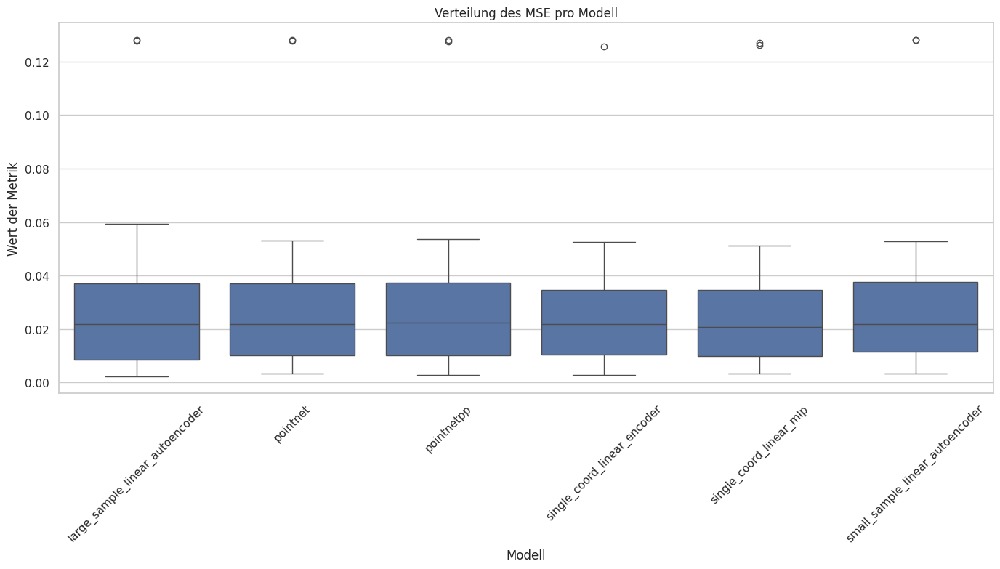

In [27]:
sns.set(style="whitegrid")

zerocenter_mse_distribution = best_zerocenter.groupby(["Model_Name"]).apply(lambda x: x["MSE"]).reset_index()

# Plot erstellen
plt.figure(figsize=(14, 8))
sns.boxplot(data=unit_cube_mse_distribution, x='Model_Name', y='MSE')
plt.title('Verteilung des MSE pro Modell')
plt.xlabel('Modell')
plt.ylabel('Wert der Metrik')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [28]:
# diff to unit cube
uc_zc_avg_diff = pd.merge(
    best_unit_cube.groupby(["Model_Name"]).mean(numeric_only=True),
    best_zerocenter.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_unit_cube', '_zerocenter')
)
uc_zc_avg_diff["deltaMSE [%]"] = (uc_zc_avg_diff["MSE_unit_cube"] - uc_zc_avg_diff["MSE_zerocenter"]) / uc_zc_avg_diff["MSE_zerocenter"] * 100
uc_zc_avg_diff["deltaMAE [%]"] = (uc_zc_avg_diff["MAE_unit_cube"] - uc_zc_avg_diff["MAE_zerocenter"]) / uc_zc_avg_diff["MAE_zerocenter"] * 100
uc_zc_avg_diff["deltaCS [%]"] = (uc_zc_avg_diff["Cosine_Similarity_unit_cube"] - uc_zc_avg_diff["Cosine_Similarity_zerocenter"]) / uc_zc_avg_diff["Cosine_Similarity_zerocenter"] * 100
uc_zc_avg_diff["deltaMSE"] = uc_zc_avg_diff["MSE_unit_cube"] - uc_zc_avg_diff["MSE_zerocenter"]
uc_zc_avg_diff["deltaMAE"] = uc_zc_avg_diff["MAE_unit_cube"] - uc_zc_avg_diff["MAE_zerocenter"]
uc_zc_avg_diff["deltaCS"] = uc_zc_avg_diff["Cosine_Similarity_unit_cube"] - uc_zc_avg_diff["Cosine_Similarity_zerocenter"]
uc_zc_avg_diff = uc_zc_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]
uc_zc_avg_diff

,deltaMSE [%],deltaMAE [%],deltaCS [%],deltaMSE,deltaMAE,deltaCS
Model_Name,,,,,,
large_sample_linear_autoencoder,2.329220,0.263206,-16.279280,0.000754,0.000261,-0.069742
pointnet,-0.163568,1.060357,4.891472,-0.000055,0.001110,0.017601
pointnetpp,-0.272962,-0.630701,-0.750663,-0.000091,-0.000679,-0.003219
single_coord_linear_encoder,0.090857,0.255892,-2.776073,0.000029,0.000262,-0.012171
single_coord_linear_mlp,-0.382065,-1.538158,-0.746051,-0.000124,-0.001619,-0.003344
small_sample_linear_autoencoder,2.974813,3.422288,2.666109,0.000972,0.003555,0.011087


In [29]:
from matplotlib.colors import LinearSegmentedColormap

c = ["darkred","red","lightcoral","white", "palegreen","green","darkgreen"]
v = [0,.15,.4,.5,0.6,.9,1.]
l = list(zip(v,c))
rwg_cmap = LinearSegmentedColormap.from_list('rg',l, N=256)
rwg_cmap_r = LinearSegmentedColormap.from_list('rg',l[::-1], N=256)

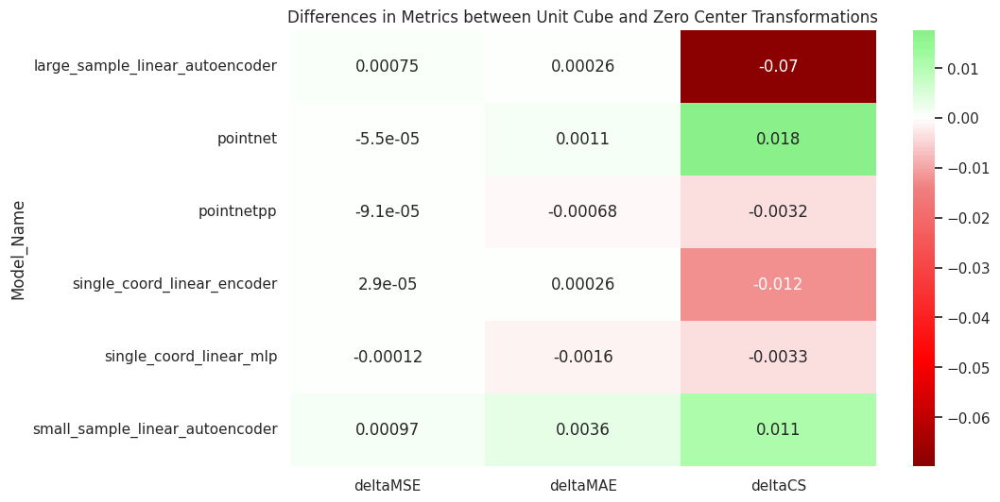

In [30]:
plt.figure(figsize=(10, 6))
sns.heatmap(uc_zc_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0)
plt.title('Differences in Metrics between Unit Cube and Zero Center Transformations')
plt.show()

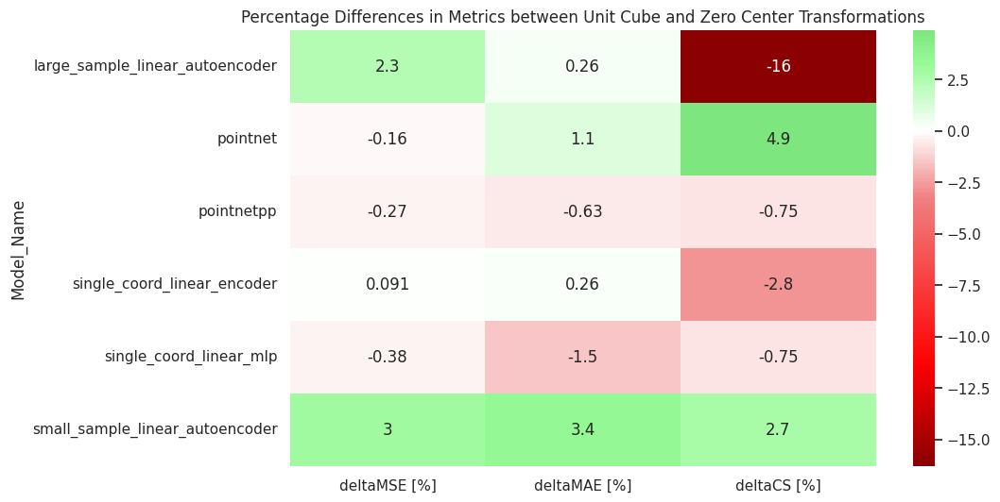

In [31]:
plt.figure(figsize=(10, 6))
sns.heatmap(uc_zc_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, cmap=rwg_cmap, center=0)
plt.title('Percentage Differences in Metrics between Unit Cube and Zero Center Transformations')
plt.show()

In [32]:
# Mean difference in metrics
uc_zc_avg_diff.mean()

deltaMSE [%]    0.762715
deltaMAE [%]    0.472147
deltaCS [%]    -2.165748
deltaMSE        0.000248
deltaMAE        0.000482
deltaCS        -0.009965
dtype: float64

In [33]:
# Oberen Ausreißer sind testergebnisse auf einem bestimmen Case - Selbe Modelle wie bei Unit Cube
best_zerocenter[best_zerocenter['MSE'] >= 0.1].sort_values(by='MSE', ascending=False)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
24,pointnet,case_k_003_left,0.0001,1,zerocenter,False,mse,0.133256,0.195484,0.050003
43,pointnetpp,case_k_003_left,0.0001,1,zerocenter,True,mse,0.129047,0.198086,0.225529
25,pointnet,case_k_003_left,0.0010,50,zerocenter,True,mse,0.127954,0.195973,0.258474
7,large_sample_linear_autoencoder,case_k_003_left,0.0100,50,zerocenter,True,mse,0.127902,0.198110,0.261081
87,small_sample_linear_autoencoder,case_k_003_left,0.1000,30,zerocenter,False,mse,0.127413,0.197962,0.272937
88,small_sample_linear_autoencoder,case_k_003_left,0.0010,30,zerocenter,True,mse,0.127077,0.196802,0.265353
42,pointnetpp,case_k_003_left,0.0001,30,zerocenter,False,mse,0.127060,0.193165,0.251429
6,large_sample_linear_autoencoder,case_k_003_left,0.0100,30,zerocenter,False,mse,0.126818,0.191435,0.265421
70,single_coord_linear_mlp,case_k_003_left,0.0100,30,zerocenter,True,mse,0.126240,0.195439,0.265352
69,single_coord_linear_mlp,case_k_003_left,0.0100,30,zerocenter,False,mse,0.124789,0.195610,0.256518


In [34]:
# Top 3 Modelle mit der niedrigsten MSE
best_zerocenter[best_zerocenter['Rotation']==False].sort_values(by='MSE', ascending=True).head(3)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
4,large_sample_linear_autoencoder,bifurication,0.0001,30,zerocenter,False,mse,0.002438,0.031619,0.835401
62,single_coord_linear_encoder,cylinder,0.0001,30,zerocenter,False,mse,0.002841,0.033967,0.943093
16,large_sample_linear_autoencoder,cylinder,0.0010,10,zerocenter,False,mse,0.003101,0.035081,0.938683


In [35]:
# Top 3 Modelle mit der niedrigsten CS
best_zerocenter[best_zerocenter['Rotation']==False].sort_values(by='Cosine_Similarity', ascending=False).head(3)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
79,single_coord_linear_mlp,cylinder,0.1000,1,zerocenter,False,mse,0.003530,0.039291,0.947382
62,single_coord_linear_encoder,cylinder,0.0001,30,zerocenter,False,mse,0.002841,0.033967,0.943093
16,large_sample_linear_autoencoder,cylinder,0.0010,10,zerocenter,False,mse,0.003101,0.035081,0.938683


In [36]:
# load model "single_coord_linear_mlp__lr_001_ep_30_transf_zerocenter_rot_False_loss_mse" to test for case cylinder

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_mlp__lr_001_ep_30_transf_zerocenter_rot_False_loss_mse.pth"

sample_size = 1
model = MLP([3*sample_size, 8, 8, 8, 4, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
#print(model)

data_path = "/home/ne34gux/workspace/experiments/data/geom_point_data/cylinder.npz"

data = np.load(data_path)
#print(data)
input_array = torch.Tensor(data["fluid_points"])
target_array = torch.Tensor(data["sys_vel"])
#print(input_array.shape, target_array.shape)

from utils.helper_functions import transform_zero_center

input_tensor, target_tensor = transform_zero_center(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
#print(input_tensor.shape, target_tensor.shape,)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor).reshape(B, 3)

#print(output_tensor.shape)


rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import cosine_similarity

#print("CS=", cosine_similarity(target_tensor, output_tensor))


del input_tensor, target_tensor, output_tensor, model

#print(input_array.shape, target_array.shape, output_array.shape)
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Zero Centered Cube',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Zero Centered Cube',
)

fig.show()

# 3. Rotation

In [37]:
result_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,single_coord_linear_mlp,case_k_003_left,0.1,30,grid128,False,mse,0.203388,0.338469,0.674098
1,single_coord_linear_mlp,case_k_008_right,0.1,30,grid128,False,mse,0.086560,0.237911,0.815950
2,single_coord_linear_mlp,case_m_006_left,0.1,30,grid128,False,mse,0.080045,0.218818,0.927286
3,single_coord_linear_mlp,case_w_027_right,0.1,30,grid128,False,mse,0.093167,0.249555,0.817183
4,single_coord_linear_mlp,case_w_038_left,0.1,30,grid128,False,mse,0.111093,0.265403,0.821367


In [38]:
rot_cond = (result_df['Rotation'] & ((result_df['Transformation'] == 'zerocenter')|(result_df['Transformation'] == 'unitcube')))
norot_cond = (~result_df['Rotation'] & ((result_df['Transformation'] == 'zerocenter')|(result_df['Transformation'] == 'unitcube')))

rot_cond.sum(), norot_cond.sum()

(np.int64(1512), np.int64(1872))

In [39]:
rot_df = result_df[rot_cond]
norot_df = result_df[norot_cond]

rot_df

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
180,single_coord_linear_mlp,case_k_003_left,0.1000,30,unitcube,True,mse,0.127598,0.197088,0.261992
181,single_coord_linear_mlp,case_k_008_right,0.1000,30,unitcube,True,mse,0.027860,0.111910,0.367138
182,single_coord_linear_mlp,case_m_006_left,0.1000,30,unitcube,True,mse,0.021359,0.102905,0.611342
183,single_coord_linear_mlp,case_w_027_right,0.1000,30,unitcube,True,mse,0.036637,0.132365,0.266009
184,single_coord_linear_mlp,case_w_038_left,0.1000,30,unitcube,True,mse,0.052593,0.158390,0.415935
...,...,...,...,...,...,...,...,...,...,...
6160,pointnet,case_w_038_left,0.0001,30,zerocenter,True,mse,1.653688,0.847219,0.409717
6161,pointnet,bifurication,0.0001,30,zerocenter,True,mse,0.548261,0.473414,0.858804
6162,pointnet,aneurysm2,0.0001,30,zerocenter,True,mse,0.127945,0.250785,0.148706
6163,pointnet,aneurysm1,0.0001,30,zerocenter,True,mse,0.217670,0.308347,0.209315


In [40]:
norot_df

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
9,single_coord_linear_mlp,case_k_003_left,0.1000,30,unitcube,False,mse,0.126710,0.196697,0.280479
10,single_coord_linear_mlp,case_k_008_right,0.1000,30,unitcube,False,mse,0.027403,0.113401,0.373016
11,single_coord_linear_mlp,case_m_006_left,0.1000,30,unitcube,False,mse,0.022401,0.108397,0.589255
12,single_coord_linear_mlp,case_w_027_right,0.1000,30,unitcube,False,mse,0.037499,0.136550,0.248340
13,single_coord_linear_mlp,case_w_038_left,0.1000,30,unitcube,False,mse,0.052493,0.158665,0.422367
...,...,...,...,...,...,...,...,...,...,...
6151,pointnet,case_w_038_left,0.0001,30,zerocenter,False,mse,0.064823,0.184580,0.412962
6152,pointnet,bifurication,0.0001,30,zerocenter,False,mse,0.011148,0.071117,0.854062
6153,pointnet,aneurysm2,0.0001,30,zerocenter,False,mse,0.013971,0.080187,0.129122
6154,pointnet,aneurysm1,0.0001,30,zerocenter,False,mse,0.018306,0.100429,0.195406


In [41]:
# average mse, mae, cosine similarity for each model with rotation
best_rot = rot_df.groupby(["Model_Name", "Case"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)
best_rot.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0100,1,unitcube,True,mse,0.012435,0.071886,-0.011161
1,large_sample_linear_autoencoder,aneurysm2,0.0100,1,unitcube,True,mse,0.008949,0.051907,0.002869
2,large_sample_linear_autoencoder,bifurication,0.0001,1,zerocenter,True,mse,0.002713,0.033099,0.828905
3,large_sample_linear_autoencoder,case_k_003_left,0.0001,1,unitcube,True,mse,0.127810,0.196960,0.255656
4,large_sample_linear_autoencoder,case_k_008_right,0.0001,1,unitcube,True,mse,0.027219,0.109760,0.364703


In [42]:
# average mse, mae, cosine similarity for each model without rotation
best_norot = norot_df.groupby(["Model_Name", "Case"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)
best_norot.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.01,30,unitcube,False,mse,0.013238,0.075121,-0.055570
1,large_sample_linear_autoencoder,aneurysm2,0.01,50,unitcube,False,mse,0.008216,0.049669,0.083326
2,large_sample_linear_autoencoder,bifurication,0.01,100,unitcube,False,mse,0.002283,0.032090,0.824174
3,large_sample_linear_autoencoder,case_k_003_left,0.01,30,zerocenter,False,mse,0.126818,0.191435,0.265421
4,large_sample_linear_autoencoder,case_k_008_right,0.01,100,unitcube,False,mse,0.026948,0.102805,0.362376


In [43]:
# rot: minimal MSE
rot_df.groupby(["Model_Name", "Case"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min")).idxmin()
    ]
).reset_index(drop=True).head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0001,1,zerocenter,True,mse,0.010817,0.074010,0.199615
1,large_sample_linear_autoencoder,aneurysm2,0.0100,1,unitcube,True,mse,0.008949,0.051907,0.002869
2,large_sample_linear_autoencoder,bifurication,0.0001,1,zerocenter,True,mse,0.002713,0.033099,0.828905
3,large_sample_linear_autoencoder,case_k_003_left,0.0010,1,zerocenter,True,mse,0.126644,0.192975,0.263293
4,large_sample_linear_autoencoder,case_k_008_right,0.0010,1,zerocenter,True,mse,0.027015,0.108719,0.367257


In [44]:
# rot: maximal CS
rot_df.groupby(["Model_Name", "Case"]).apply(
    lambda x: x.loc[
        (x["Cosine_Similarity"].rank(method="max")).idxmax()
    ]
).reset_index(drop=True).head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0001,10,zerocenter,True,mse,0.016991,0.095179,0.210238
1,large_sample_linear_autoencoder,aneurysm2,0.0010,50,zerocenter,True,mse,0.014218,0.078765,0.112298
2,large_sample_linear_autoencoder,bifurication,0.0100,50,zerocenter,True,mse,0.006228,0.049485,0.863930
3,large_sample_linear_autoencoder,case_k_003_left,0.0001,50,zerocenter,True,mse,0.127480,0.198993,0.269878
4,large_sample_linear_autoencoder,case_k_008_right,0.0010,50,zerocenter,True,mse,0.029025,0.114868,0.369455


In [45]:
# norot: minimal MSE
norot_df.groupby(["Model_Name", "Case"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min")).idxmin()
    ]
).reset_index(drop=True).head()


,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0001,30,zerocenter,False,mse,0.011049,0.075559,0.191396
1,large_sample_linear_autoencoder,aneurysm2,0.0100,100,unitcube,False,mse,0.007462,0.054656,0.130430
2,large_sample_linear_autoencoder,bifurication,0.0100,100,unitcube,False,mse,0.002283,0.032090,0.824174
3,large_sample_linear_autoencoder,case_k_003_left,0.0010,10,zerocenter,False,mse,0.126413,0.189102,0.275122
4,large_sample_linear_autoencoder,case_k_008_right,0.0010,10,zerocenter,False,mse,0.026057,0.104773,0.376016


In [46]:
# norot: maximal CS
norot_df.groupby(["Model_Name", "Case"]).apply(
    lambda x: x.loc[
        (x["Cosine_Similarity"].rank(method="max")).idxmax()
    ]
).reset_index(drop=True).head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0001,100,zerocenter,False,mse,0.014591,0.089823,0.202883
1,large_sample_linear_autoencoder,aneurysm2,0.0001,50,zerocenter,False,mse,0.013500,0.080249,0.149996
2,large_sample_linear_autoencoder,bifurication,0.0001,100,zerocenter,False,mse,0.004568,0.045325,0.860002
3,large_sample_linear_autoencoder,case_k_003_left,0.0001,100,zerocenter,False,mse,0.128336,0.202159,0.279197
4,large_sample_linear_autoencoder,case_k_008_right,0.0010,50,zerocenter,False,mse,0.027544,0.112968,0.376972


In [47]:
rot_norot_avg_diff = pd.merge(
    best_rot.groupby(["Model_Name"]).mean(numeric_only=True),
    best_norot.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_rot', '_norot')
)
rot_norot_avg_diff = rot_norot_avg_diff[['MSE_rot', 'MAE_rot', 'Cosine_Similarity_rot', 'MSE_norot', 'MAE_norot', 'Cosine_Similarity_norot']]
rot_norot_avg_diff

,MSE_rot,MAE_rot,Cosine_Similarity_rot,MSE_norot,MAE_norot,Cosine_Similarity_norot
Model_Name,,,,,,
large_sample_linear_autoencoder,0.032480,0.098760,0.409934,0.032511,0.097727,0.408684
pointnet,0.033122,0.104821,0.443378,0.032994,0.104624,0.335098
pointnetpp,0.032763,0.103368,0.435039,0.034227,0.110715,0.408694
single_coord_linear_mlp,0.032150,0.104470,0.443653,0.032146,0.103909,0.439653
small_sample_linear_autoencoder,0.032567,0.103412,0.416465,0.032845,0.104524,0.413207


In [48]:
rot_norot_avg_diff["deltaMSE [%]"] = (rot_norot_avg_diff["MSE_rot"] - rot_norot_avg_diff["MSE_norot"]) / rot_norot_avg_diff["MSE_norot"]
rot_norot_avg_diff["deltaMAE [%]"] = (rot_norot_avg_diff["MAE_rot"] - rot_norot_avg_diff["MAE_norot"]) / rot_norot_avg_diff["MAE_norot"]
rot_norot_avg_diff["deltaCS [%]"] = (rot_norot_avg_diff["Cosine_Similarity_rot"] - rot_norot_avg_diff["Cosine_Similarity_norot"]) / rot_norot_avg_diff["Cosine_Similarity_norot"]
rot_norot_avg_diff["deltaMSE"] = rot_norot_avg_diff["MSE_rot"] - rot_norot_avg_diff["MSE_norot"]
rot_norot_avg_diff["deltaMAE"] = rot_norot_avg_diff["MAE_rot"] - rot_norot_avg_diff["MAE_norot"]
rot_norot_avg_diff["deltaCS"] = rot_norot_avg_diff["Cosine_Similarity_rot"] - rot_norot_avg_diff["Cosine_Similarity_norot"]
rot_norot_avg_diff = rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]
rot_norot_avg_diff

,deltaMSE [%],deltaMAE [%],deltaCS [%],deltaMSE,deltaMAE,deltaCS
Model_Name,,,,,,
large_sample_linear_autoencoder,-0.000954,0.010562,0.003059,-0.000031,0.001032,0.001250
pointnet,0.003884,0.001882,0.323130,0.000128,0.000197,0.108280
pointnetpp,-0.042782,-0.066362,0.064463,-0.001464,-0.007347,0.026346
single_coord_linear_mlp,0.000111,0.005400,0.009099,0.000004,0.000561,0.004000
small_sample_linear_autoencoder,-0.008451,-0.010642,0.007885,-0.000278,-0.001112,0.003258


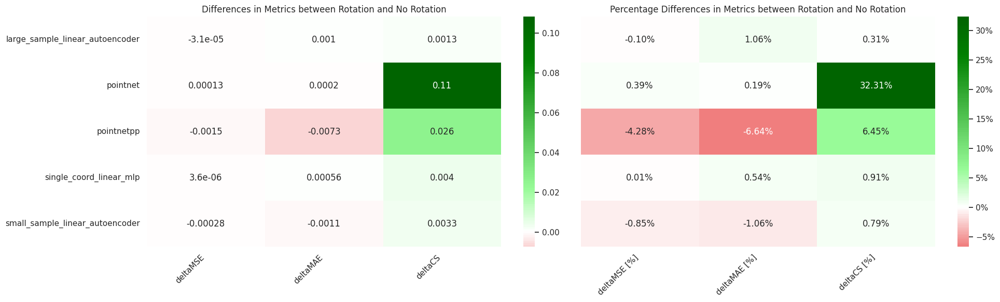

In [49]:
rot_norot_avg_diff = pd.merge(
    best_rot.groupby(["Model_Name"]).mean(numeric_only=True),
    best_norot.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_rot', '_norot')
)
rot_norot_avg_diff = rot_norot_avg_diff[['MSE_rot', 'MAE_rot', 'Cosine_Similarity_rot', 'MSE_norot', 'MAE_norot', 'Cosine_Similarity_norot']]
rot_norot_avg_diff
rot_norot_avg_diff["deltaMSE [%]"] = (rot_norot_avg_diff["MSE_rot"] - rot_norot_avg_diff["MSE_norot"]) / rot_norot_avg_diff["MSE_norot"]
rot_norot_avg_diff["deltaMAE [%]"] = (rot_norot_avg_diff["MAE_rot"] - rot_norot_avg_diff["MAE_norot"]) / rot_norot_avg_diff["MAE_norot"]
rot_norot_avg_diff["deltaCS [%]"] = (rot_norot_avg_diff["Cosine_Similarity_rot"] - rot_norot_avg_diff["Cosine_Similarity_norot"]) / rot_norot_avg_diff["Cosine_Similarity_norot"]
rot_norot_avg_diff["deltaMSE"] = rot_norot_avg_diff["MSE_rot"] - rot_norot_avg_diff["MSE_norot"]
rot_norot_avg_diff["deltaMAE"] = rot_norot_avg_diff["MAE_rot"] - rot_norot_avg_diff["MAE_norot"]
rot_norot_avg_diff["deltaCS"] = rot_norot_avg_diff["Cosine_Similarity_rot"] - rot_norot_avg_diff["Cosine_Similarity_norot"]
rot_norot_avg_diff = rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]
rot_norot_avg_diff

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(rot_norot_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Rotation and No Rotation')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap=rwg_cmap, center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Rotation and No Rotation')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

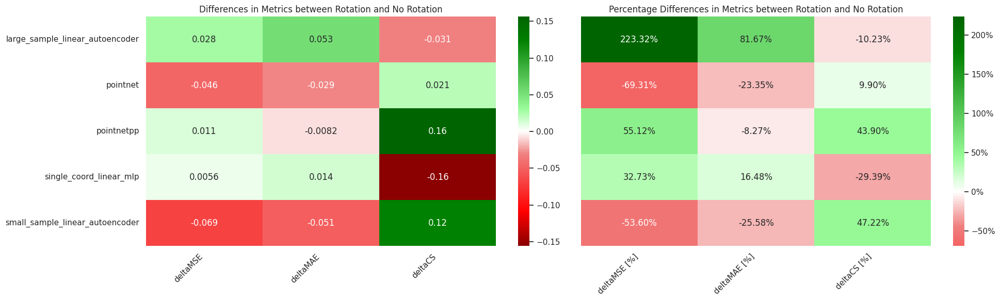

In [50]:
unit_cube_rot_norot_avg_diff = pd.merge(
    best_rot[best_rot['Transformation']=='unitcube'].groupby(["Model_Name"]).mean(numeric_only=True),
    best_norot[best_norot['Transformation']=='unitcube'].groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_rot', '_norot')
)
unit_cube_rot_norot_avg_diff = unit_cube_rot_norot_avg_diff[['MSE_rot', 'MAE_rot', 'Cosine_Similarity_rot', 'MSE_norot', 'MAE_norot', 'Cosine_Similarity_norot']]
unit_cube_rot_norot_avg_diff["deltaMSE [%]"] = (unit_cube_rot_norot_avg_diff["MSE_rot"] - unit_cube_rot_norot_avg_diff["MSE_norot"]) / unit_cube_rot_norot_avg_diff["MSE_norot"]
unit_cube_rot_norot_avg_diff["deltaMAE [%]"] = (unit_cube_rot_norot_avg_diff["MAE_rot"] - unit_cube_rot_norot_avg_diff["MAE_norot"]) / unit_cube_rot_norot_avg_diff["MAE_norot"]
unit_cube_rot_norot_avg_diff["deltaCS [%]"] = (unit_cube_rot_norot_avg_diff["Cosine_Similarity_rot"] - unit_cube_rot_norot_avg_diff["Cosine_Similarity_norot"]) / unit_cube_rot_norot_avg_diff["Cosine_Similarity_norot"]
unit_cube_rot_norot_avg_diff["deltaMSE"] = unit_cube_rot_norot_avg_diff["MSE_rot"] - unit_cube_rot_norot_avg_diff["MSE_norot"]
unit_cube_rot_norot_avg_diff["deltaMAE"] = unit_cube_rot_norot_avg_diff["MAE_rot"] - unit_cube_rot_norot_avg_diff["MAE_norot"]
unit_cube_rot_norot_avg_diff["deltaCS"] = unit_cube_rot_norot_avg_diff["Cosine_Similarity_rot"] - unit_cube_rot_norot_avg_diff["Cosine_Similarity_norot"]
unit_cube_rot_norot_avg_diff = unit_cube_rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]
unit_cube_rot_norot_avg_diff

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(unit_cube_rot_norot_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Rotation and No Rotation')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(unit_cube_rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap=rwg_cmap, center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Rotation and No Rotation')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()


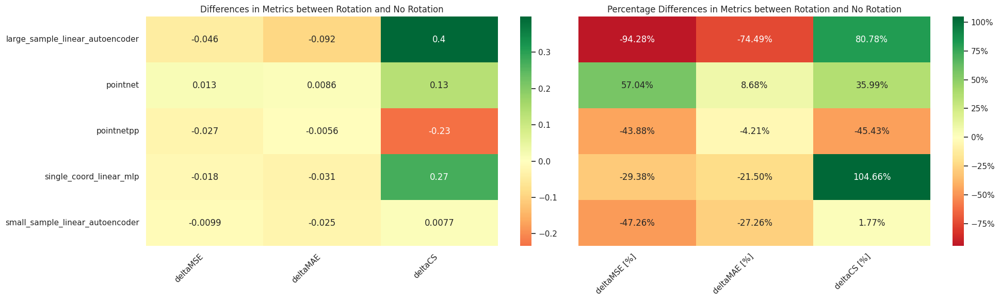

In [51]:
zero_center_rot_norot_avg_diff = pd.merge(
    best_rot[best_rot['Transformation']=='zerocenter'].groupby(["Model_Name"]).mean(numeric_only=True),
    best_norot[best_norot['Transformation']=='zerocenter'].groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_rot', '_norot')
)
zero_center_rot_norot_avg_diff = zero_center_rot_norot_avg_diff[['MSE_rot', 'MAE_rot', 'Cosine_Similarity_rot', 'MSE_norot', 'MAE_norot', 'Cosine_Similarity_norot']]
zero_center_rot_norot_avg_diff["deltaMSE [%]"] = (zero_center_rot_norot_avg_diff["MSE_rot"] - zero_center_rot_norot_avg_diff["MSE_norot"]) / zero_center_rot_norot_avg_diff["MSE_norot"]
zero_center_rot_norot_avg_diff["deltaMAE [%]"] = (zero_center_rot_norot_avg_diff["MAE_rot"] - zero_center_rot_norot_avg_diff["MAE_norot"]) / zero_center_rot_norot_avg_diff["MAE_norot"]
zero_center_rot_norot_avg_diff["deltaCS [%]"] = (zero_center_rot_norot_avg_diff["Cosine_Similarity_rot"] - zero_center_rot_norot_avg_diff["Cosine_Similarity_norot"]) / zero_center_rot_norot_avg_diff["Cosine_Similarity_norot"]
zero_center_rot_norot_avg_diff["deltaMSE"] = zero_center_rot_norot_avg_diff["MSE_rot"] - zero_center_rot_norot_avg_diff["MSE_norot"]
zero_center_rot_norot_avg_diff["deltaMAE"] = zero_center_rot_norot_avg_diff["MAE_rot"] - zero_center_rot_norot_avg_diff["MAE_norot"]
zero_center_rot_norot_avg_diff["deltaCS"] = zero_center_rot_norot_avg_diff["Cosine_Similarity_rot"] - zero_center_rot_norot_avg_diff["Cosine_Similarity_norot"]
zero_center_rot_norot_avg_diff = zero_center_rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]
zero_center_rot_norot_avg_diff

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(zero_center_rot_norot_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap='RdYlGn', center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Rotation and No Rotation')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(zero_center_rot_norot_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap='RdYlGn', center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Rotation and No Rotation')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

In [52]:
rot_norot_avg_diff.mean()

deltaMSE [%]   -0.009638
deltaMAE [%]   -0.011832
deltaCS [%]     0.081527
deltaMSE       -0.000328
deltaMAE       -0.001334
deltaCS         0.028627
dtype: float64

In [53]:
# Modelle bei denen Rot fehlt
set(best_norot['Model_Name'].unique()).difference(set(best_rot['Model_Name'].unique()))

{'single_coord_linear_encoder'}

# 3. Grid

In [54]:
grid_df = result_df[(result_df['Transformation'] == 'grid64') | (result_df['Transformation'] == 'grid128')]
grid64_df = grid_df[grid_df['Transformation'] == 'grid64']
grid128_df = grid_df[grid_df['Transformation'] == 'grid128']
grid_df

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,single_coord_linear_mlp,case_k_003_left,0.1000,30,grid128,False,mse,0.203388,0.338469,0.674098
1,single_coord_linear_mlp,case_k_008_right,0.1000,30,grid128,False,mse,0.086560,0.237911,0.815950
2,single_coord_linear_mlp,case_m_006_left,0.1000,30,grid128,False,mse,0.080045,0.218818,0.927286
3,single_coord_linear_mlp,case_w_027_right,0.1000,30,grid128,False,mse,0.093167,0.249555,0.817183
4,single_coord_linear_mlp,case_w_038_left,0.1000,30,grid128,False,mse,0.111093,0.265403,0.821367
...,...,...,...,...,...,...,...,...,...,...
6187,pointnet,case_w_038_left,0.0001,30,grid128,False,mse,0.052433,0.172044,0.828181
6188,pointnet,aneurysm1,0.0001,30,grid128,False,mse,0.025502,0.133076,0.830879
6189,pointnet,aneurysm2,0.0001,30,grid128,False,mse,0.041713,0.180162,0.775443
6190,pointnet,bifurication,0.0001,30,grid128,False,mse,0.052190,0.151951,0.912485


In [55]:
best_grid_df = grid_df.groupby(["Model_Name", "Case", "Rotation"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)
best_grid_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0100,30,grid64,False,mse,0.012605,0.076035,0.031406
1,large_sample_linear_autoencoder,aneurysm2,0.0100,30,grid64,False,mse,0.010482,0.063415,0.009357
2,large_sample_linear_autoencoder,bifurication,0.0100,10,grid128,False,mse,0.006491,0.053952,-0.513376
3,large_sample_linear_autoencoder,case_k_003_left,0.0001,100,grid128,False,mse,0.151780,0.240143,0.694152
4,large_sample_linear_autoencoder,case_k_008_right,0.0010,100,grid128,False,mse,0.044281,0.149044,0.840805


In [56]:
# load model "large_sample_linear_autoencoder__lr_0001_ep_100_transf_grid128_rot_False_loss_mse" to test for case aneurysm1

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/large_sample_linear_autoencoder__lr_0001_ep_100_transf_grid128_rot_False_loss_mse.pth"

sample_size = 2**12

model = MLP([3*sample_size, 2**11, 2**10, 2**11, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model

data_path = "/home/ne34gux/workspace/experiments/data/geom_grid128_data/aneurysm1.npz"

data = np.load(data_path)
#print(data)
input_array = torch.Tensor(data["vessel_mask"])
target_array = torch.Tensor(data["interp_vel"])
#print("grid_view:", input_array.shape, target_array.shape)


from utils.helper_functions import grid_to_point_cloud

input_tensor, target_tensor = grid_to_point_cloud(input_array, target_array)
B = input_tensor.shape[0] // sample_size
#print("B", B)

#print("point_view", input_tensor.shape, target_tensor.shape)

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, sample_size, 3)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, sample_size, 3)
#print("after batching", input_tensor.shape, target_tensor.shape)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor.flatten(start_dim=1)).reshape(-1, sample_size, 3)
    
#print("output", output_tensor.shape)

non_zero_vel_idx = torch.all(target_tensor != 0, dim=1)
            
input_tensor = input_tensor.reshape(B*sample_size,3)
target_tensor = target_tensor.reshape(B*sample_size,3)
output_tensor = output_tensor.reshape(B*sample_size,3)

non_zero_vel_idx = torch.all(target_tensor != 0, dim=1)

input_tensor = input_tensor[non_zero_vel_idx]
target_tensor = target_tensor[non_zero_vel_idx]
output_tensor = output_tensor[non_zero_vel_idx]

#print("non_zero", input_tensor.shape, target_tensor.shape, output_tensor.shape)

from utils.metrics import cosine_similarity

print("CS=", cosine_similarity(target_tensor, output_tensor))
cs_value = calculate_cosine_similarity(target_tensor, output_tensor)
angle_value = calculate_angle_difference(target_tensor, output_tensor)
print("CS=", cs_value.mean())
print("Angle=", angle_value.mean())


rand_idx = np.random.choice(range(input_tensor.shape[0]), 1000)

input_array = input_tensor.numpy()[rand_idx]
target_array = target_tensor.numpy()[rand_idx]
output_array = output_tensor.numpy()[rand_idx]

del input_tensor, target_tensor, output_tensor, model

input_array.shape, target_array.shape, output_array.shape

## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a Large Linear Autoencoder on a 64 Grid',
)


fig.show()
## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a Large Linear Autoencoder on a 64 Grid',
)

fig.show()

CS= 0.86641526222229
CS= tensor(0.8664)
Angle= tensor(23.4253)


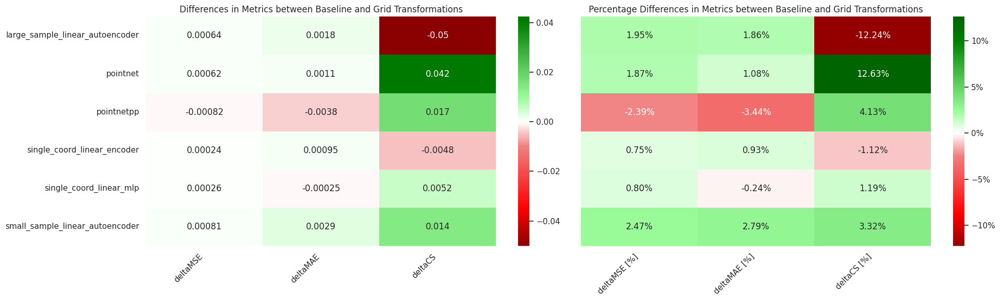

In [57]:
# Differenzen zwischen Baseline und Grid Transformationen

grid_base_avg_diff = pd.merge(
    best_unit_cube.groupby(["Model_Name"]).mean(numeric_only=True),
    best_norot.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_rot', '_norot')
)

grid_base_avg_diff = grid_base_avg_diff[['MSE_rot', 'MAE_rot', 'Cosine_Similarity_rot', 'MSE_norot', 'MAE_norot', 'Cosine_Similarity_norot']]
grid_base_avg_diff["deltaMSE [%]"] = (grid_base_avg_diff["MSE_rot"] - grid_base_avg_diff["MSE_norot"]) / grid_base_avg_diff["MSE_norot"]
grid_base_avg_diff["deltaMAE [%]"] = (grid_base_avg_diff["MAE_rot"] - grid_base_avg_diff["MAE_norot"]) / grid_base_avg_diff["MAE_norot"]
grid_base_avg_diff["deltaCS [%]"] = (grid_base_avg_diff["Cosine_Similarity_rot"] - grid_base_avg_diff["Cosine_Similarity_norot"]) / grid_base_avg_diff["Cosine_Similarity_norot"]
grid_base_avg_diff["deltaMSE"] = grid_base_avg_diff["MSE_rot"] - grid_base_avg_diff["MSE_norot"]
grid_base_avg_diff["deltaMAE"] = grid_base_avg_diff["MAE_rot"] - grid_base_avg_diff["MAE_norot"]
grid_base_avg_diff["deltaCS"] = grid_base_avg_diff["Cosine_Similarity_rot"] - grid_base_avg_diff["Cosine_Similarity_norot"]
grid_base_avg_diff = grid_base_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(grid_base_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Baseline and Grid Transformations')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(grid_base_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap=rwg_cmap, center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Baseline and Grid Transformations')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

In [58]:
grid_base_avg_diff.mean()

deltaMSE [%]    0.009091
deltaMAE [%]    0.004974
deltaCS [%]     0.013197
deltaMSE        0.000291
deltaMAE        0.000459
deltaCS         0.003889
dtype: float64

In [59]:
# create best_grid64 and best_grid128

best_grid64_df = grid64_df.groupby(["Model_Name", "Case", "Rotation"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)

best_grid128_df = grid128_df.groupby(["Model_Name", "Case", "Rotation"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)

best_grid64_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.01,30,grid64,False,mse,0.012605,0.076035,0.031406
1,large_sample_linear_autoencoder,aneurysm2,0.01,30,grid64,False,mse,0.010482,0.063415,0.009357
2,large_sample_linear_autoencoder,bifurication,0.01,30,grid64,False,mse,0.005138,0.052427,0.151632
3,large_sample_linear_autoencoder,case_k_003_left,0.01,100,grid64,False,mse,0.179676,0.297408,0.619591
4,large_sample_linear_autoencoder,case_k_008_right,0.01,50,grid64,False,mse,0.076613,0.221651,0.688757


In [60]:
best_grid128_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0001,30,grid128,False,mse,0.023694,0.122736,0.830324
1,large_sample_linear_autoencoder,aneurysm2,0.0010,100,grid128,False,mse,0.040752,0.177482,0.782452
2,large_sample_linear_autoencoder,bifurication,0.0100,10,grid128,False,mse,0.006491,0.053952,-0.513376
3,large_sample_linear_autoencoder,case_k_003_left,0.0001,100,grid128,False,mse,0.151780,0.240143,0.694152
4,large_sample_linear_autoencoder,case_k_008_right,0.0010,100,grid128,False,mse,0.044281,0.149044,0.840805


In [61]:
best_grid64_df.mean(numeric_only=True)

Learning_Rate         0.009483
Epochs               38.166667
Rotation              0.000000
MSE                   0.056655
MAE                   0.153399
Cosine_Similarity     0.538533
dtype: float64

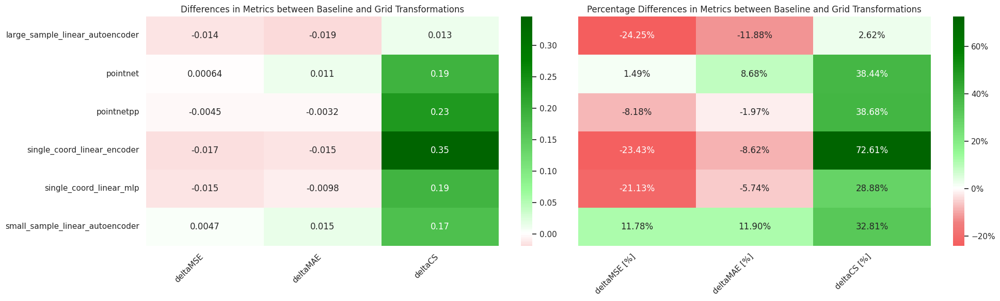

In [62]:
# Differenzen zwischen Grid Transformationen mit Größe 128 und 64

grid128_grid64_avg_diff = pd.merge(
    best_grid128_df.groupby(["Model_Name"]).mean(numeric_only=True),
    best_grid64_df.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_grid128', '_grid64')
)

grid128_grid64_avg_diff = grid128_grid64_avg_diff[['MSE_grid128', 'MAE_grid128', 'Cosine_Similarity_grid128', 'MSE_grid64', 'MAE_grid64', 'Cosine_Similarity_grid64']]
grid128_grid64_avg_diff["deltaMSE [%]"] = (grid128_grid64_avg_diff["MSE_grid128"] - grid128_grid64_avg_diff["MSE_grid64"]) / grid128_grid64_avg_diff["MSE_grid64"]
grid128_grid64_avg_diff["deltaMAE [%]"] = (grid128_grid64_avg_diff["MAE_grid128"] - grid128_grid64_avg_diff["MAE_grid64"]) / grid128_grid64_avg_diff["MAE_grid64"]
grid128_grid64_avg_diff["deltaCS [%]"] = (grid128_grid64_avg_diff["Cosine_Similarity_grid128"] - grid128_grid64_avg_diff["Cosine_Similarity_grid64"]) / grid128_grid64_avg_diff["Cosine_Similarity_grid64"]
grid128_grid64_avg_diff["deltaMSE"] = grid128_grid64_avg_diff["MSE_grid128"] - grid128_grid64_avg_diff["MSE_grid64"]
grid128_grid64_avg_diff["deltaMAE"] = grid128_grid64_avg_diff["MAE_grid128"] - grid128_grid64_avg_diff["MAE_grid64"]
grid128_grid64_avg_diff["deltaCS"] = grid128_grid64_avg_diff["Cosine_Similarity_grid128"] - grid128_grid64_avg_diff["Cosine_Similarity_grid64"]
grid128_grid64_avg_diff = grid128_grid64_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(grid128_grid64_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Baseline and Grid Transformations')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(grid128_grid64_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap=rwg_cmap, center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Baseline and Grid Transformations')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

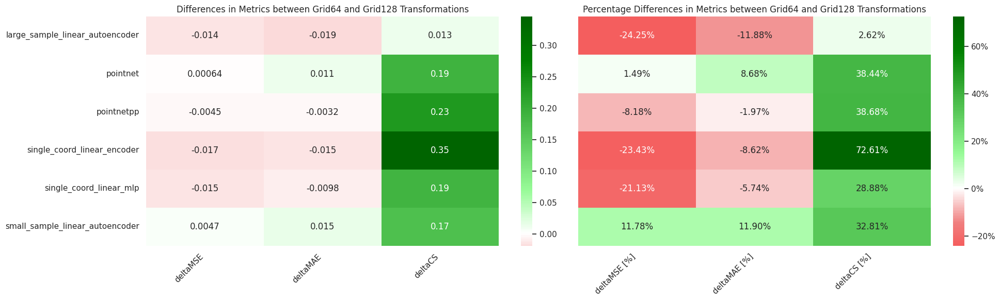

In [63]:
# Differenzen zwischen Grid Transformationen mit Größe 64 und 128

grid64_grid128_avg_diff = pd.merge(
    best_grid64_df.groupby(["Model_Name"]).mean(numeric_only=True),
    best_grid128_df.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_grid64', '_grid128')
)

grid64_grid128_avg_diff = grid64_grid128_avg_diff[['MSE_grid64', 'MAE_grid64', 'Cosine_Similarity_grid64', 'MSE_grid128', 'MAE_grid128', 'Cosine_Similarity_grid128']]
grid64_grid128_avg_diff["deltaMSE [%]"] = (grid64_grid128_avg_diff["MSE_grid128"] - grid64_grid128_avg_diff["MSE_grid64"]) / grid64_grid128_avg_diff["MSE_grid64"]
grid64_grid128_avg_diff["deltaMAE [%]"] = (grid64_grid128_avg_diff["MAE_grid128"] - grid64_grid128_avg_diff["MAE_grid64"]) / grid64_grid128_avg_diff["MAE_grid64"]
grid64_grid128_avg_diff["deltaCS [%]"] = (grid64_grid128_avg_diff["Cosine_Similarity_grid128"] - grid64_grid128_avg_diff["Cosine_Similarity_grid64"]) / grid64_grid128_avg_diff["Cosine_Similarity_grid64"]
grid64_grid128_avg_diff["deltaMSE"] = grid64_grid128_avg_diff["MSE_grid128"] - grid64_grid128_avg_diff["MSE_grid64"]
grid64_grid128_avg_diff["deltaMAE"] = grid64_grid128_avg_diff["MAE_grid128"] - grid64_grid128_avg_diff["MAE_grid64"]
grid64_grid128_avg_diff["deltaCS"] = grid64_grid128_avg_diff["Cosine_Similarity_grid128"] - grid64_grid128_avg_diff["Cosine_Similarity_grid64"]
grid64_grid128_avg_diff = grid64_grid128_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(grid64_grid128_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Grid64 and Grid128 Transformations')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(grid64_grid128_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap=rwg_cmap, center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Grid64 and Grid128 Transformations')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

In [64]:
grid64_grid128_avg_diff.mean()

deltaMSE [%]   -0.106199
deltaMAE [%]   -0.012719
deltaCS [%]     0.356730
deltaMSE       -0.007597
deltaMAE       -0.003365
deltaCS         0.189507
dtype: float64

# 5. Relativer Input

In [65]:
rel_df = result_df[result_df['Transformation'] == 'rel']
rel_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
36,single_coord_linear_mlp,case_k_003_left,0.1,30,rel,False,mse,0.127061,0.198184,0.264151
37,single_coord_linear_mlp,case_k_008_right,0.1,30,rel,False,mse,0.027742,0.112103,0.371102
38,single_coord_linear_mlp,case_m_006_left,0.1,30,rel,False,mse,0.020741,0.100918,0.627659
39,single_coord_linear_mlp,case_w_027_right,0.1,30,rel,False,mse,0.036756,0.133353,0.261791
40,single_coord_linear_mlp,case_w_038_left,0.1,30,rel,False,mse,0.053170,0.159789,0.407262


In [66]:
best_rel_df = rel_df.groupby(["Model_Name", "Case", "Rotation"]).apply(
    lambda x: x.loc[
        (x["MSE"].rank(method="min") + x["MAE"].rank(method="min") + x["Cosine_Similarity"].rank(method="max")).idxmin()
    ]
).reset_index(drop=True)
best_rel_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,large_sample_linear_autoencoder,aneurysm1,0.0100,30,rel,False,mse,0.141379,0.126249,-0.044951
1,large_sample_linear_autoencoder,aneurysm2,0.0010,50,rel,False,mse,0.026384,0.093990,-0.002877
2,large_sample_linear_autoencoder,bifurication,0.0001,10,rel,False,mse,0.005460,0.047874,0.767784
3,large_sample_linear_autoencoder,case_k_003_left,0.0001,10,rel,False,mse,0.129208,0.199272,0.266145
4,large_sample_linear_autoencoder,case_k_008_right,0.0001,10,rel,False,mse,0.025450,0.104948,0.379775


In [67]:
best_rel_df.mean(numeric_only=True)

Learning_Rate         0.013983
Epochs               24.388889
Rotation              0.000000
MSE                   0.032535
MAE                   0.100177
Cosine_Similarity     0.386286
dtype: float64

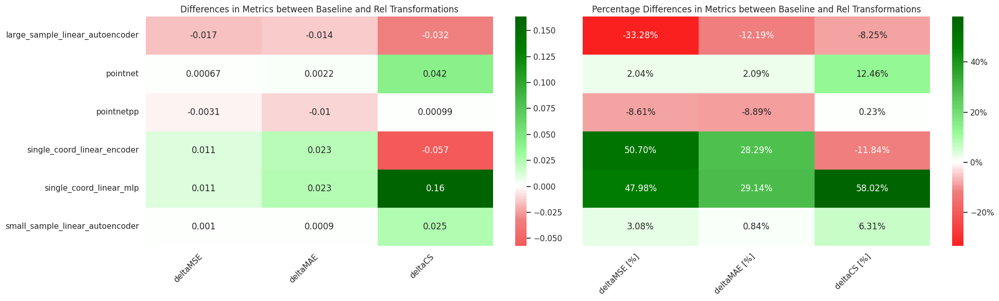

In [68]:
# Differenzen zwischen Baseline und Rel Transformation

rel_base_avg_diff = pd.merge(
    best_unit_cube.groupby(["Model_Name"]).mean(numeric_only=True),
    best_rel_df.groupby(["Model_Name"]).mean(numeric_only=True),
    on="Model_Name",
    suffixes=('_rot', '_norot')
)

rel_base_avg_diff = rel_base_avg_diff[['MSE_rot', 'MAE_rot', 'Cosine_Similarity_rot', 'MSE_norot', 'MAE_norot', 'Cosine_Similarity_norot']]
rel_base_avg_diff["deltaMSE [%]"] = (rel_base_avg_diff["MSE_rot"] - rel_base_avg_diff["MSE_norot"]) / rel_base_avg_diff["MSE_norot"]
rel_base_avg_diff["deltaMAE [%]"] = (rel_base_avg_diff["MAE_rot"] - rel_base_avg_diff["MAE_norot"]) / rel_base_avg_diff["MAE_norot"]
rel_base_avg_diff["deltaCS [%]"] = (rel_base_avg_diff["Cosine_Similarity_rot"] - rel_base_avg_diff["Cosine_Similarity_norot"]) / rel_base_avg_diff["Cosine_Similarity_norot"]
rel_base_avg_diff["deltaMSE"] = rel_base_avg_diff["MSE_rot"] - rel_base_avg_diff["MSE_norot"]
rel_base_avg_diff["deltaMAE"] = rel_base_avg_diff["MAE_rot"] - rel_base_avg_diff["MAE_norot"]
rel_base_avg_diff["deltaCS"] = rel_base_avg_diff["Cosine_Similarity_rot"] - rel_base_avg_diff["Cosine_Similarity_norot"]
rel_base_avg_diff = rel_base_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]', 'deltaMSE', 'deltaMAE', 'deltaCS']]

fig, axes = plt.subplots(1, 2, figsize=(20, 6))

sns.heatmap(rel_base_avg_diff[['deltaMSE', 'deltaMAE', 'deltaCS']], annot=True, cmap=rwg_cmap, center=0, ax=axes[0])
axes[0].set_title('Differences in Metrics between Baseline and Rel Transformations')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

sns.heatmap(rel_base_avg_diff[['deltaMSE [%]', 'deltaMAE [%]', 'deltaCS [%]']], annot=True, fmt='.2%', cmap=rwg_cmap, center=0, cbar_kws={'format': "{x:.0%}"}, ax=axes[1])
axes[1].set_title('Percentage Differences in Metrics between Baseline and Rel Transformations')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_yticklabels([])

axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[0].set_ylabel("")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

In [69]:
rel_base_avg_diff.mean()

deltaMSE [%]    0.103194
deltaMAE [%]    0.065453
deltaCS [%]     0.094898
deltaMSE        0.000567
deltaMAE        0.004135
deltaCS         0.023669
dtype: float64

In [70]:
# models with highest CS
rel_df.sort_values(by='Cosine_Similarity', ascending=False).head(5)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
710,single_coord_linear_mlp,cylinder,0.0010,10,rel,False,mse,0.003586,0.032425,0.953727
1043,single_coord_linear_encoder,cylinder,0.1000,30,rel,False,mse,0.003457,0.033174,0.953570
1151,single_coord_linear_encoder,cylinder,0.0001,30,rel,False,mse,0.003567,0.032658,0.953505
1682,single_coord_linear_encoder,cylinder,0.0010,1,rel,False,mse,0.003580,0.033800,0.953039
44,single_coord_linear_mlp,cylinder,0.1000,30,rel,False,mse,0.003518,0.035240,0.952300


In [71]:
# load model "single_coord_linear_mlp__lr_1_ep_30_transf_rel_rot_False_loss_mse" to test for case cylinder

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_mlp__lr_1_ep_30_transf_rel_rot_False_loss_mse.pth"

sample_size = 1
model = MLP([8*sample_size, 8, 8, 8, 4, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
#print(model)

data_path = "/home/ne34gux/workspace/experiments/data/geom_rel_data/cylinder.npz"

data = np.load(data_path)
print(data)
input_array = torch.Tensor(data["input"])
target_array = torch.Tensor(data["target"])
#print(input_array.shape, target_array.shape)

from utils.helper_functions import transform_linear

input_tensor, target_tensor = transform_linear(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 8)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
#print(input_tensor.shape, target_tensor.shape,)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor).reshape(B, 3)

#print(output_tensor.shape)


rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,8).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import cosine_similarity

print("CS=", cosine_similarity(target_tensor, output_tensor))
cs_value = calculate_cosine_similarity(target_tensor, output_tensor)
angle_value = calculate_angle_difference(target_tensor, output_tensor)
print("CS=", cs_value.mean())
print("Angle=", angle_value.mean())



del input_tensor, target_tensor, output_tensor, model

#print(input_array.shape, target_array.shape, output_array.shape)
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Zero Centered Cube',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Zero Centered Cube',
)

fig.show()

NpzFile '/home/ne34gux/workspace/experiments/data/geom_rel_data/cylinder.npz' with keys: input, target, mesh_points


CS= 0.9523003101348877
CS= tensor(0.9971)
Angle= tensor(4.3443)


In [72]:
# Model with best CS
rel_df[rel_df["Case"].str.startswith("case")].sort_values(by='Cosine_Similarity', ascending=False).head(3)

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
1495,single_coord_linear_encoder,case_k_008_right,0.0010,10,rel,False,mse,0.037776,0.110462,0.700727
514,single_coord_linear_mlp,case_k_008_right,0.0001,50,rel,False,mse,0.010947,0.070822,0.695923
145,single_coord_linear_mlp,case_k_008_right,0.0001,30,rel,False,mse,0.012493,0.076587,0.695241


In [73]:

# load model "single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse" to test for case cylinder

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse.pth"

sample_size = 1
model = MLP([8*sample_size, 8, 8, 8, 4, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
#print(model)

data_path = "/home/ne34gux/workspace/experiments/data/vessel_relative_data/case_k_008_right.npz"

data = np.load(data_path)
print(data)
input_array = torch.Tensor(data["input"])
target_array = torch.Tensor(data["target"])
#print(input_array.shape, target_array.shape)

from utils.helper_functions import transform_linear

input_tensor, target_tensor = transform_linear(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 8)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
#print(input_tensor.shape, target_tensor.shape,)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor).reshape(B, 3)

#print(output_tensor.shape)


rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,8).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import cosine_similarity

print("CS=", cosine_similarity(target_tensor, output_tensor))
cs_value = calculate_cosine_similarity(target_tensor, output_tensor)
angle_value = calculate_angle_difference(target_tensor, output_tensor)
print("CS=", cs_value.mean())
print("Angle=", angle_value.mean())



del input_tensor, target_tensor, output_tensor, model

#print(input_array.shape, target_array.shape, output_array.shape)
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Zero Centered Cube',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=3
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Zero Centered Cube',
)

fig.show()

NpzFile '/home/ne34gux/workspace/experiments/data/vessel_relative_data/case_k_008_right.npz' with keys: input, target, reference
CS= 0.6384024620056152
CS= tensor(0.7681)
Angle= tensor(31.4213)


In [74]:
# load model "single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse" to test for case case_k_003_left

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse.pth"

sample_size = 1
model = MLP([8*sample_size, 8, 8, 8, 4, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
#print(model)

data_path = "/home/ne34gux/workspace/experiments/data/vessel_relative_data/case_k_003_left.npz"

data = np.load(data_path)
print(data)
input_array = torch.Tensor(data["input"])
target_array = torch.Tensor(data["target"])
#print(input_array.shape, target_array.shape)

from utils.helper_functions import transform_linear

input_tensor, target_tensor = transform_linear(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 8)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
#print(input_tensor.shape, target_tensor.shape,)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor).reshape(B, 3)

#print(output_tensor.shape)


rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,8).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import cosine_similarity

print("CS=", cosine_similarity(target_tensor, output_tensor))
print("CS=", calculate_cosine_similarity(target_tensor, output_tensor).mean())

cs_value = calculate_cosine_similarity(target_tensor, output_tensor)
angle_value = calculate_angle_difference(target_tensor, output_tensor)
print("CS=", cs_value.mean())
print("Angle=", angle_value.mean())



del input_tensor, target_tensor, output_tensor, model

#print(input_array.shape, target_array.shape, output_array.shape)
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=5
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on Relative Input',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=5
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on on Relative Input',
)

fig.show()

NpzFile '/home/ne34gux/workspace/experiments/data/vessel_relative_data/case_k_003_left.npz' with keys: input, target, reference
CS= 0.5262339115142822
CS= tensor(0.6277)
CS= tensor(0.6277)
Angle= tensor(43.4932)


In [75]:
# load model "single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse" to test for case cylinder

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse.pth"

sample_size = 1
model = MLP([8*sample_size, 8, 8, 8, 4, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
#print(model)

data_path = "/home/ne34gux/workspace/experiments/data/vessel_relative_data/case_k_003_left.npz"

data = np.load(data_path)
#print(data)
input_array = torch.Tensor(data["input"])
target_array = torch.Tensor(data["target"])
#print(input_array.shape, target_array.shape)

from utils.helper_functions import transform_linear

input_tensor, target_tensor = transform_linear(input_array, target_array)
B = input_tensor.shape[0] // sample_size

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 8)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, 3)
#print(input_tensor.shape, target_tensor.shape,)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor).reshape(B, 3)

#print(output_tensor.shape)


rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,8).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import *

print("CS=", cosine_similarity(target_tensor, output_tensor))
print("MSE=", mse_error(target_tensor, output_tensor))
print("MAE=", mae_error(target_tensor, output_tensor))

cs_value = calculate_cosine_similarity(target_tensor, output_tensor)
angle_value = calculate_angle_difference(target_tensor, output_tensor)
print("CS=", cs_value.mean())
print("Angle=", angle_value.mean())

del input_tensor, target_tensor, output_tensor, model

#print(input_array.shape, target_array.shape, output_array.shape)
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='scaled',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Zero Centered Cube',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='scaled',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Zero Centered Cube',
)

fig.show()

CS= 0.5262339115142822
MSE= 0.10076065361499786
MAE= 0.1690579354763031
CS= tensor(0.6277)
Angle= tensor(43.4932)


In [76]:
result_df.head()

,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
0,single_coord_linear_mlp,case_k_003_left,0.1,30,grid128,False,mse,0.203388,0.338469,0.674098
1,single_coord_linear_mlp,case_k_008_right,0.1,30,grid128,False,mse,0.086560,0.237911,0.815950
2,single_coord_linear_mlp,case_m_006_left,0.1,30,grid128,False,mse,0.080045,0.218818,0.927286
3,single_coord_linear_mlp,case_w_027_right,0.1,30,grid128,False,mse,0.093167,0.249555,0.817183
4,single_coord_linear_mlp,case_w_038_left,0.1,30,grid128,False,mse,0.111093,0.265403,0.821367


# Overall Performance

In [77]:
cond = (result_df['Case'] != 'cylinder') & (result_df['Transformation'] != 'grid64') & (result_df['Transformation'] != 'grid128')
result_df[cond].sort_values(by='Cosine_Similarity', ascending=False)


,Model_Name,Case,Learning_Rate,Epochs,Transformation,Rotation,Loss_Function,MSE,MAE,Cosine_Similarity
464,single_coord_linear_mlp,bifurication,0.0001,50,unitcube,True,mse,0.005765,0.045625,0.908884
347,single_coord_linear_mlp,bifurication,0.0100,50,unitcube,True,mse,0.005808,0.045127,0.905024
194,single_coord_linear_mlp,bifurication,0.0100,30,unitcube,True,mse,0.005688,0.049660,0.901739
887,single_coord_linear_mlp,bifurication,0.0010,1,unitcube,True,mse,0.005948,0.048025,0.901332
410,single_coord_linear_mlp,bifurication,0.0010,50,unitcube,False,mse,0.005404,0.047477,0.898932
...,...,...,...,...,...,...,...,...,...,...
1316,single_coord_linear_encoder,case_m_006_left,0.0010,50,rel,False,mse,0.092752,0.220779,-0.577816
1496,single_coord_linear_encoder,case_m_006_left,0.0010,10,rel,False,mse,0.456518,0.456333,-0.592063
1721,single_coord_linear_encoder,case_m_006_left,0.0001,1,rel,False,mse,0.247428,0.414876,-0.598530
1697,single_coord_linear_encoder,bifurication,0.0001,1,zerocenter,False,mse,0.018609,0.089894,-0.773082


In [78]:
# load model "single_coord_linear_mlp__lr_01_ep_30_transf_rel_rot_False_loss_mse" to test for case cylinder

import torch
from utils.models import MLP

model_path = "/home/ne34gux/workspace/experiments/trained_models/single_coord_linear_mlp__lr_0001_ep_30_transf_unitcube_rot_True_loss_mse.pth"

in_channels = 3

sample_size = 1
model = MLP([in_channels*sample_size, 8, 8, 8, 4, 3*sample_size])
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
#print(model)

data_path = "/home/ne34gux/workspace/experiments/data/geom_point_data/bifurication.npz"

data = np.load(data_path)
#print(data)
input_array = torch.Tensor(data["fluid_points"])
target_array = torch.Tensor(data["sys_vel"])
#print(input_array.shape, target_array.shape)

from utils.helper_functions import transform_unit_cube

input_tensor, target_tensor = transform_unit_cube(input_array, target_array)
B = input_tensor.shape[0] // sample_size
#print(B)

input_tensor = torch.tensor(input_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, sample_size, in_channels)
target_tensor = torch.tensor(target_tensor[:sample_size*B], dtype=torch.float32).reshape(-1, sample_size, 3)
#print(input_tensor.shape, target_tensor.shape,)

model.eval()
with torch.no_grad():
    output_tensor = model(input_tensor).reshape(B, 3)

#print(output_tensor.shape)


target_tensor = target_tensor.reshape(-1, 3)

#print(target_tensor.shape, output_tensor.shape)

rand_idx = np.random.choice(range(B*sample_size), 1000)

input_array = input_tensor.reshape(B*sample_size,in_channels).numpy()[rand_idx]
target_array = target_tensor.reshape(B*sample_size,3).numpy()[rand_idx]
output_array = output_tensor.reshape(B*sample_size,3).numpy()[rand_idx]

from utils.metrics import *

print("CS=", cosine_similarity(target_tensor, output_tensor))
print("MSE=", mse_error(target_tensor, output_tensor))
print("MAE=", mae_error(target_tensor, output_tensor))

#print(target_tensor.shape, output_tensor.shape)

cs_value = calculate_cosine_similarity(target_tensor, output_tensor)
angle_value = calculate_angle_difference(target_tensor, output_tensor)
print("CS=", cs_value.mean())
print("Angle=", angle_value.mean())

#import torch.nn.functional as F
#print(F.cosine_similarity(target_tensor, output_tensor, dim=1))

del input_tensor, target_tensor, output_tensor, model

#print(input_array.shape, target_array.shape, output_array.shape)
## visualize prediction

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=output_array[:, 0],
    v=output_array[:, 1],
    w=output_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Prediction Visualization of a MLP on a Zero Centered Cube',
)


fig.show()

## visualize target

import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Cone(
    x=input_array[:, 0],
    y=input_array[:, 1],
    z=input_array[:, 2],
    u=target_array[:, 0],
    v=target_array[:, 1],
    w=target_array[:, 2],
    colorscale='Viridis',
    sizemode='absolute',
    sizeref=1
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=800,
    height=800,
    title='Target Visualization of a MLP on a Zero Centered Cube',
)

fig.show()

CS= 0.8716856241226196
MSE= 0.0061646015383303165
MAE= 0.04687922075390816
CS= tensor(0.9322)
Angle= tensor(18.2019)


In [79]:
import torch

def calculate_angle_difference(tensor1, tensor2, chunk_size=10000, degrees=True):
    """
    Calculate the angle difference between two tensors of shape (N, 3) in chunks, skipping zero-vectors.

    Args:
    tensor1 (torch.Tensor): First tensor of shape (N, 3).
    tensor2 (torch.Tensor): Second tensor of shape (N, 3).
    chunk_size (int): Size of chunks to split the tensors into for processing.
    degrees (bool): If True, return the angle difference in degrees. Otherwise, return in radians.

    Returns:
    torch.Tensor: Angle difference between the two tensors in radians or degrees.
    """
    angle_differences = []
    for i in range(0, tensor1.shape[0], chunk_size):
        t1_chunk = tensor1[i:i+chunk_size]
        t2_chunk = tensor2[i:i+chunk_size]
        
        # Calculate norms
        norm_tensor1 = torch.norm(t1_chunk, dim=1)
        norm_tensor2 = torch.norm(t2_chunk, dim=1)
        
        # Skip zero-vectors
        non_zero_mask = (norm_tensor1 != 0) & (norm_tensor2 != 0)
        t1_chunk = t1_chunk[non_zero_mask]
        t2_chunk = t2_chunk[non_zero_mask]
        
        # Normalize vectors
        t1_chunk = t1_chunk / norm_tensor1[non_zero_mask].unsqueeze(1)
        t2_chunk = t2_chunk / norm_tensor2[non_zero_mask].unsqueeze(1)
        
        # Calculate dot product
        dot_product = torch.sum(t1_chunk * t2_chunk, dim=1)
        
        # Clamp dot product to avoid numerical issues with arccos
        dot_product = torch.clamp(dot_product, -1.0, 1.0)
        
        # Calculate angle difference
        angle_diff = torch.acos(dot_product)
        if degrees:
            angle_diff = torch.rad2deg(angle_diff)
        angle_differences.append(angle_diff)
    
    return torch.cat(angle_differences)

calculate_angle_difference(target_tensor, output_tensor).mean()

NameError: name 'target_tensor' is not defined